In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import yfinance as yf

import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller
import numpy.linalg as la
from hmmlearn import hmm
    
from pykalman import KalmanFilter

import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="whitegrid")

import warnings
warnings.filterwarnings("ignore")

In [32]:
webpage = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
industry = "Information Technology"

def importData(start_date ,webpage=webpage, industry=industry):
    # Importing SP500 Data
    df_sp = pd.read_html(webpage)[0] # [0] takes the first table

    # Manipulating dataframe
    df_sp = df_sp[["Symbol", "GICS Sector", "Date first added"]] # Retaining only 3 columns
    df_sp = df_sp[df_sp["GICS Sector"] == industry] # Retaining only relevant industry

    df_sp["Date first added"] = pd.to_datetime(df_sp["Date first added"], format='%Y-%m-%d') # Reformatting date to datetime
    df_sp = df_sp[df_sp["Date first added"] <= start_date] # Retaining only companies added before start date
    
    tickers = df_sp["Symbol"].values.tolist() 
    return tickers

def read_data(ticker, start, end, interval="1d", ohlc="null", log = True): 
    df = yf.download(ticker, start=start, end=end, interval=interval)
    if ohlc in {"Open", "High", "Low", "Close", "Adj Close", "Volume"}:
        df = df[[ohlc]]
        df.columns = df.columns.droplevel()
    else: 
        pass
    if log == True:
        df = np.log(df)
    else: 
        pass
    return df

def calc_returns(df):
    rets = df.pct_change()
    rets.dropna(inplace = True)
    return rets


#checking the correlations of the cointegrated pairs in order to look for the best pair 

def checking_corr(pairs, log_data, corr_threshold):
    pairs_corr={}
    for i in range(len(pairs)):
        series_1 = log_data[pairs[i][0]]
        series_2 = log_data[pairs[i][1]]
        corr = np.corrcoef(series_1,series_2)[0,1]
        if corr > corr_threshold:
            pairs_corr[(pairs[i][0],pairs[i][1])] = (round(corr,3),pairs[i][2])
#             pairs_corr.append((round(corr,3),pairs[i][2]))
#             pairs_corr.append(pairs[i][2])
    print("There are "+str(len(pairs_corr))+" pairs with correlation more than "+str(corr_threshold)+".")
    
    return pairs_corr

def find_cointegrated_pairs(data, pval_threshold):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    
    for i in tqdm(range(n)):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < pval_threshold:
                pairs.append((keys[i], keys[j] , pvalue))
    return score_matrix, pvalue_matrix, pairs


def get_OLS(x,y):
    x =sm.add_constant(x)
    model = sm.OLS(y,x).fit()
    summary = model.summary()
#     print(summary)
    slope = model.params[1]
    intercept = model.params[0]
#     sm.graphics.plot_fit(model,1 , vlines=False)
    return(slope, intercept)

def KalmanFilterRegression(x,y,colname):
    delta=1e-5
    transcov= delta/(1-delta)*np.eye(2)
    obsmat = np.vstack([x[colname] , np.ones(x[colname].shape)]).T[:,np.newaxis]
    slope , intercept = get_OLS(x[colname],y[colname]) #initialization values
    static_hedge_ratio = slope
    initial_state_mean = np.array([slope , intercept])
    initial_state_covariance = np.cov(np.array([x[colname],y[colname]]) , bias= True)
    
    kf=KalmanFilter(n_dim_obs=1, n_dim_state=2 , initial_state_mean=initial_state_mean,
                    initial_state_covariance=initial_state_covariance,
                    transition_matrices = np.eye(2), 
                    observation_matrices = obsmat,
                    observation_covariance = 1,
                    transition_covariance = transcov)

    state_means , state_cov = kf.filter(y[colname])
    plt.figure(figsize=(15,10))
    plt.plot(x.index, state_means[:,0], label='Dynamic Hedge Ratio From Kalman Filter')
    plt.plot(x.index, static_hedge_ratio*np.ones(len(x.index)), label='Static Hedge Ratio From Linear Regression')
    plt.legend()
    plt.show()
    plt.figure(figsize=(10,10))
    plt.plot(x.index, state_means[:,1], label='Intercept From Kalman Filter')
    plt.ylim()
    plt.legend()
    plt.show()
     
    
    
    return state_means , state_cov , static_hedge_ratio
    
    


def backtester_trading_strategy(tickers , state_means , state_cov , static_hedge_ratio , colname):
    print('in backetester')

#     colname='Log Price'


    state_means['dynamic spread'] = state_means['Y '+colname] - state_means['slope'] * state_means['X '+colname]
    state_means['moving_avg_60']= state_means['dynamic spread'].rolling(60).mean()
    state_means['moving_avg_5']= state_means['dynamic spread'].rolling(5).mean()
    print(state_means.shape)


    state_means['std_60'] = state_means['dynamic spread'].rolling(60).std()
    state_means['zscore'] = (state_means['moving_avg_5'] - state_means['moving_avg_60'])/state_means['std_60']
    state_means.dropna(inplace=True)
    state_means['static spread'] = state_means['Y '+colname] - static_hedge_ratio * state_means['X '+colname]
    static_spread = state_means['Y '+colname] - static_hedge_ratio * state_means['X '+colname]
    print(state_means.shape)
    
    plt.figure(figsize=(15,10))
    plt.subplot(2,1,1)
    plt.title(tickers)
    plt.plot(state_means.index, state_means['dynamic spread'], label='Kalman Filter spread')
    plt.plot(state_means.index, state_means['moving_avg_60'], label='Kalman Filter mean 60', linewidth=2)
    plt.plot(state_means.index, state_means['moving_avg_5'], label='Kalman Filter mean 5', linewidth=2)
    plt.plot(state_means.index, static_spread, label='Static hedge ratio spread', alpha=0.5)
    plt.legend()
    plt.show()
    
    
    plt.figure(figsize=(15,7))
    plt.plot(state_means.index , state_means['zscore'] , label = 'Z score')
    plt.axhline(0, color='black')
    plt.axhline(1.0, color='red', linestyle='--')
    plt.axhline(-1.0, color='green', linestyle='--')
    plt.legend(['Rolling Ratio z-Score', 'Mean', '+1', '-1'])
    plt.show()


    
    
def get_dynamic_and_static_HR(tickers , start_date , end_date , colname):
    x = read_data(tickers[0],start = start_date, end=end_date ,log=False)[['Adj Close']]
    y = read_data(tickers[1],start = start_date, end=end_date,log=False)[['Adj Close']]
    x['Log Price'] = np.log(x['Adj Close'])
    y['Log Price'] = np.log(y['Adj Close'])
#     return(KalmanFilterRegression(x,y,colname))
    state_means , state_cov , static_hedge_ratio = KalmanFilterRegression(x,y,colname)
    state_means = pd.DataFrame(state_means , columns =['slope','intercept'])
    state_means.index = x.index
    state_means[['X Adj Close','X Log Price']]=x
    state_means[['Y Adj Close','Y Log Price']]=y
#     static_spread = y[colname] - static_hedge_ratio * x[colname]
    backtester_trading_strategy(tickers , state_means , state_cov , static_hedge_ratio , colname)
    dyn_spr = state_means['dynamic spread']
    zscore_60_5 = state_means['zscore']
    dyn_spr.plot()
    buy = dyn_spr.copy()
    sell = dyn_spr.copy()
    buy[zscore_60_5>-1] = 0
    sell[zscore_60_5<1] = 0
    buy.plot(color='g', linestyle='None', marker='^')
    sell.plot(color='r', linestyle='None', marker='^')
    x1,x2,y1,y2 = plt.axis()
    plt.axis((x1,x2,dyn_spr.min(),dyn_spr.max()))
    plt.legend(['Dynamic Spread', 'Buy Signal', 'Sell Signal'])
    plt.show()
    
    plt.figure(figsize=(18,9))
    S1 = state_means['X Adj Close']
    S2 = state_means['Y Adj Close']

    S1.plot(color='b')
    S2.plot(color='c')
    buyR = 0*S1.copy()
    sellR = 0*S1.copy()

    # When buying the ratio, buy S1 and sell S2
    buyR[buy!=0] = S1[buy!=0]
    sellR[buy!=0] = S2[buy!=0]
    # When selling the ratio, sell S1 and buy S2 
    buyR[sell!=0] = S2[sell!=0]
    sellR[sell!=0] = S1[sell!=0]

    buyR[60:].plot(color='g', linestyle='None', marker='^')
    sellR[60:].plot(color='r', linestyle='None', marker='^')
    x1,x2,y1,y2 = plt.axis()
    plt.axis((x1,x2,min(S1.min(),S2.min()),max(S1.max(),S2.max())))

    plt.legend([tickers[0],tickers[1], 'Buy Signal', 'Sell Signal'])
    plt.show()
    
    countS1 = 0
    countS2 = 0
    money = 0*S1.copy()
    for i in range(len(dyn_spr)):
        if(zscore_60_5[i] >1):
            money[i]= S1[i] -S2[i]*dyn_spr[i]
            countS1 -= 1
            countS2 += dyn_spr[i]
            # Buy long if the z-score is < 1
        elif zscore_60_5[i] < -1:
            money[i]=- S1[i] + S2[i] * dyn_spr[i]
            countS1 += 1
            countS2 -= dyn_spr[i]
        # Clear positions if the z-score between -.5 and .5
        elif abs(zscore_60_5[i]) < 0.5:
            money[i]= countS1*S1[i] + S2[i] * countS2
            countS1 = 0
            countS2 = 0

    state_means['money']=money
    plt.plot(state_means['money'].cumsum())
    PNL = state_means['money'].sum()
    hit_ratio = state_means[state_means['money'] > state_means['money'].shift(1)].shape[0] / state_means[state_means['money'] != state_means['money'].shift(1)].shape[0]

    no_of_trades = state_means[state_means['money'] != state_means['money'].shift(1)].shape[0]

    return_portfolio = -100 * (PNL+state_means[state_means['money']<0]['money'][0])/state_means[state_means['money']<0]['money'][0]
    drawdown = state_means['money'].min()
    return({'PNL':PNL,
            'hit ratio':hit_ratio,
            'no_of_trades':no_of_trades,
            'return_portflio':return_portfolio,
            'max drawdown':drawdown
           })


### Hidden Markov Model

In [4]:
df = yf.download('^GSPC','2000-01-01','2022-09-01', interval='1d')
df = df[['Adj Close']]
df.reset_index(inplace = True)
df['Returns'] = np.log(df['Adj Close']/df['Adj Close'].shift(1))
df.dropna(inplace=True)

[*********************100%***********************]  1 of 1 completed


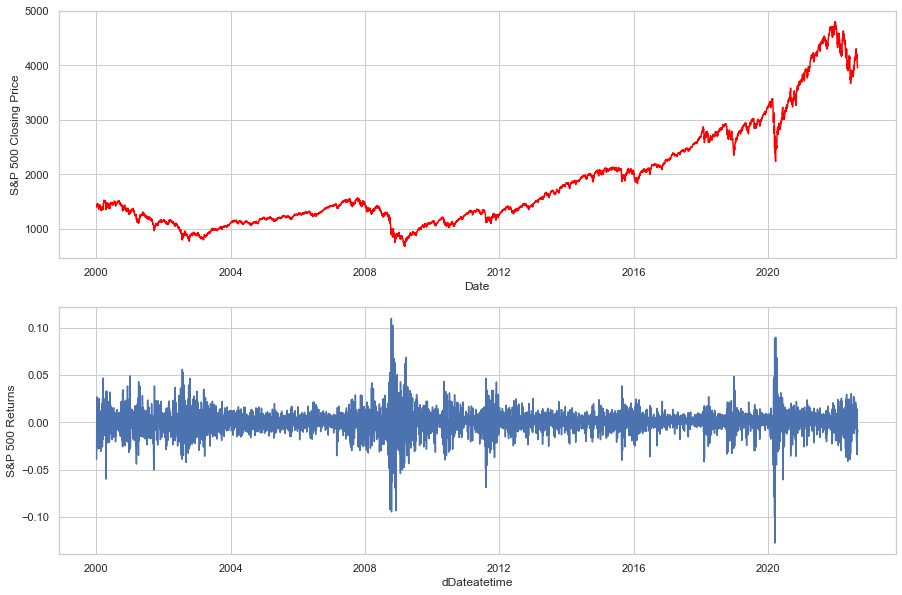

In [5]:
plt.figure(figsize = (15, 10))
plt.subplot(2,1,1)
plt.plot(df["Date"], df["Adj Close"], color='red')
plt.xlabel("Date")
plt.ylabel("S&P 500 Closing Price")
plt.grid(True)
plt.subplot(2,1,2)
plt.plot(df["Date"], df["Returns"])
plt.xlabel("dDateatetime")
plt.ylabel("S&P 500 Returns")
plt.grid(True)
plt.show()

In [6]:
X = df[['Returns']].values

model = hmm.GaussianHMM(n_components=2 , covariance_type='diag',
                       n_iter=50 , random_state=42)

model.fit(X)

GaussianHMM(n_components=2, n_iter=50, random_state=42)

In [7]:
Z = model.predict(X)

states = pd.unique(Z)

print(states)

print(model.startprob_)
print(model.transmat_)

[1 0]
[3.146279e-133 1.000000e+000]
[[0.98942524 0.01057476]
 [0.02559011 0.97440989]]


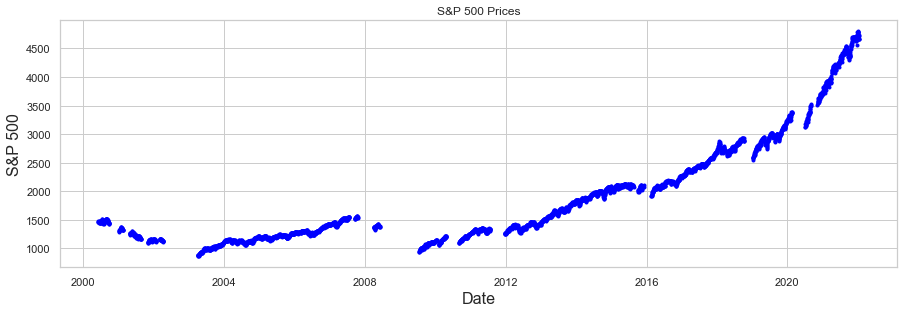

Text(0, 0.5, 'S&P 500 Returns')

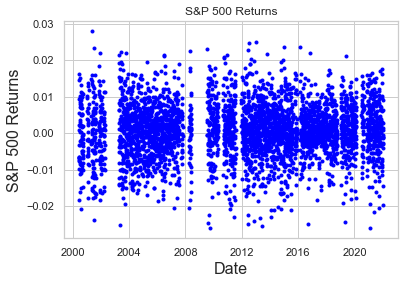

In [8]:
plt.figure(figsize = (15, 10))
plt.subplot(2,1,1)
# for i in states:
want = (Z == 0)
x = df["Date"].iloc[want]
y = df["Adj Close"].iloc[want]
plt.plot(x, y, '.',color='blue')
# plt.legend(states, fontsize=16)
plt.grid(True)
plt.title('S&P 500 Prices')
plt.xlabel("Date", fontsize=16)
plt.ylabel("S&P 500", fontsize=16)
plt.show()
want = (Z == 0)
x = df["Date"].iloc[want]
y = df["Returns"].iloc[want]
# plt.subplot(2,2,2)
plt.plot(x, y, '.',color='blue')
plt.grid(True)
plt.title('S&P 500 Returns')

plt.xlabel("Date", fontsize=16)
plt.ylabel("S&P 500 Returns", fontsize=16)

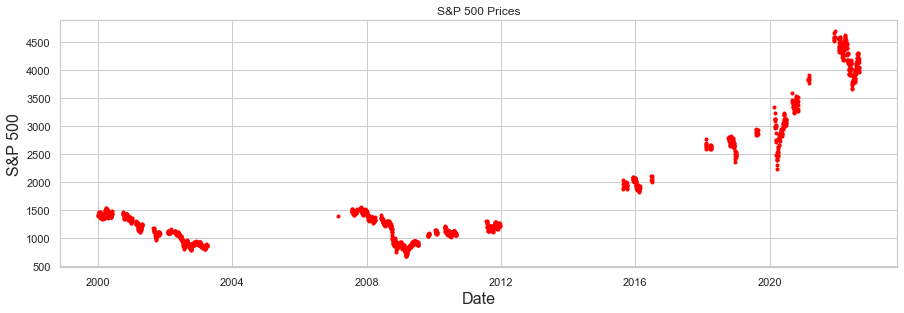

Text(0, 0.5, 'S&P 500 Returns')

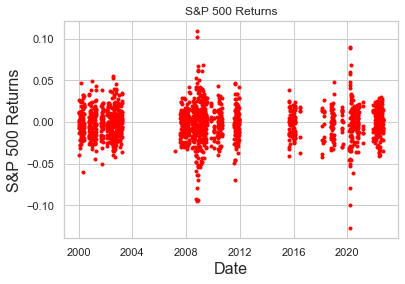

In [9]:
plt.figure(figsize = (15, 10))
plt.subplot(2,1,1)
# for i in states:
want = (Z == 1)
x = df["Date"].iloc[want]
y = df["Adj Close"].iloc[want]
plt.plot(x, y, '.',color='red')
# plt.legend(states, fontsize=16)
plt.grid(True)
plt.title('S&P 500 Prices')
plt.xlabel("Date", fontsize=16)
plt.ylabel("S&P 500", fontsize=16)
plt.show()
want = (Z == 1)
x = df["Date"].iloc[want]
y = df["Returns"].iloc[want]
# plt.subplot(2,2,2)
plt.plot(x, y, '.',color='red')
plt.grid(True)
plt.title('S&P 500 Returns')

plt.xlabel("Date", fontsize=16)
plt.ylabel("S&P 500 Returns", fontsize=16)

In [10]:
df['state'] = Z
df['diff from previous state'] = df['state'] - df['state'].shift(1)

'Bull Market Dates' : 	2003-04-03 to 2007-07-23


'Bear Market Dates' : 2007-07-24 to 2009-07-16

### Bull Market

In [33]:
start_date = "2003-04-03"
end_date = "2007-07-23"
pval_threshold = 0.03

In [34]:
tickers = importData(start_date = start_date)
data = read_data(tickers, start=start_date, end=end_date, ohlc = "Adj Close")
rets = calc_returns(data)
rets.head()

[*********************100%***********************]  18 of 18 completed


,AAPL,ADBE,ADI,ADP,ADSK,AMAT,CSCO,FISV,HPQ,IBM,INTC,INTU,MSFT,MU,NLOK,NTAP,NVDA,ORCL
Date,,,,,,,,,,,,,,,,,,
2003-04-04,0.002291,-0.009190,-0.005405,0.002427,-0.007309,-0.006935,0.002254,-0.006881,-0.001906,-0.003583,-0.012734,0.005097,-0.009046,0.000532,-0.011281,-0.003740,-0.621983,-0.009586
2003-04-07,-0.003654,0.010146,0.007834,0.003544,0.010276,0.011371,-0.004510,0.002813,-0.003838,-0.001036,0.007488,0.000914,0.001154,0.014647,0.003197,0.013828,0.432883,0.013113
2003-04-08,0.001830,-0.008057,-0.029381,-0.000454,-0.001728,-0.014738,-0.004577,-0.004140,-0.018031,-0.001303,-0.006185,0.000911,0.005849,-0.006646,0.002241,0.000981,-0.280401,-0.007949
2003-04-09,0.012004,-0.005707,0.000127,-0.002965,-0.013784,-0.010487,-0.013068,-0.013764,-0.015993,-0.004485,-0.010664,-0.005035,-0.014498,-0.018511,-0.013142,-0.022102,-0.211415,-0.012892
2003-04-10,-0.008233,0.006074,0.002404,0.000918,0.001506,0.005000,0.000000,0.003565,0.008803,0.001000,0.005166,0.002861,0.000297,0.001647,-0.030754,0.009732,0.268094,0.007961


In [35]:
rets.tail()

,AAPL,ADBE,ADI,ADP,ADSK,AMAT,CSCO,FISV,HPQ,IBM,INTC,INTU,MSFT,MU,NLOK,NTAP,NVDA,ORCL
Date,,,,,,,,,,,,,,,,,,
2007-07-16,0.001869,-0.000785,-0.002850,0.000905,0.000166,0.002479,0.000000,-0.001916,0.001476,0.002331,-0.000275,-0.001106,0.002277,0.006629,-0.001494,-0.004046,0.009204,-0.003480
2007-07-17,0.004068,0.002610,-0.002025,-0.000844,0.001487,0.020202,-0.001757,0.001457,0.000541,0.002411,0.005188,-0.001314,0.007985,-0.003553,-0.002002,0.009956,-0.002183,0.003144
2007-07-18,-0.003951,-0.000324,-0.003623,-0.005059,-0.002922,-0.002293,-0.003214,-0.000396,-0.002869,0.000667,-0.017552,-0.001321,0.001457,-0.005272,-0.004037,0.008253,-0.009402,0.000520
2007-07-19,0.009402,0.005075,-0.001035,0.003318,0.006209,0.001970,0.005540,-0.002986,0.009708,0.010055,0.002873,0.000408,0.006061,-0.001689,0.007072,0.013946,-0.000564,0.003272
2007-07-20,0.018212,-0.003570,-0.002728,-0.004603,-0.018797,-0.005269,-0.003847,-0.006470,0.001053,-0.002151,-0.010274,0.001928,-0.003560,-0.005407,-0.000498,-0.007812,-0.005676,0.000171


100%|██████████| 18/18 [00:18<00:00,  1.05s/it]


<AxesSubplot:>

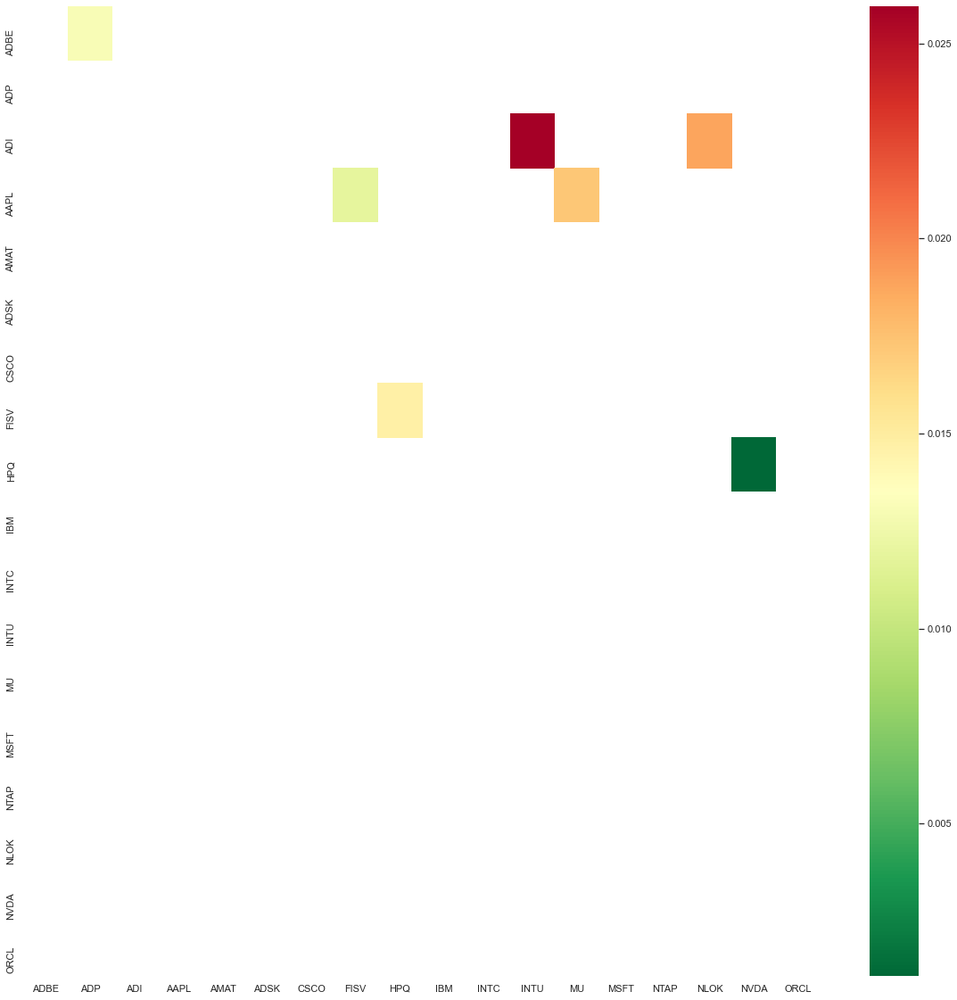

In [36]:
scores, pvalues, pairs = find_cointegrated_pairs(data , pval_threshold=pval_threshold)

fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(pvalues, xticklabels=tickers, yticklabels=tickers, cmap='RdYlGn_r' 
                , mask = (pvalues >= pval_threshold))

In [37]:
pairs

[('AAPL', 'ADBE', 0.01308932328320724),
 ('ADI', 'INTU', 0.025953077299216577),
 ('ADI', 'NTAP', 0.01879061282403553),
 ('ADP', 'FISV', 0.011930587765433017),
 ('ADP', 'MSFT', 0.017298451526252395),
 ('FISV', 'HPQ', 0.014745888698195691),
 ('HPQ', 'NVDA', 0.0010874298863598106)]

In [38]:
final_pairs = checking_corr(pairs, data, corr_threshold = 0.80)
# final_pairs = pd.DataFrame([final_pairs])

There are 4 pairs with correlation more than 0.8.


In [39]:
final_pairs = pd.DataFrame.from_dict(final_pairs , orient='index').reset_index()
final_pairs.columns=['Pairs','Correlation_score','Cointegration_score']

In [40]:
final_pairs

,Pairs,Correlation_score,Cointegration_score
0,"(AAPL, ADBE)",0.963,0.013089
1,"(ADP, FISV)",0.851,0.011931
2,"(FISV, HPQ)",0.921,0.014746
3,"(HPQ, NVDA)",0.968,0.001087


  0%|          | 0/4 [00:00<?, ?it/s]

('AAPL', 'ADBE')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


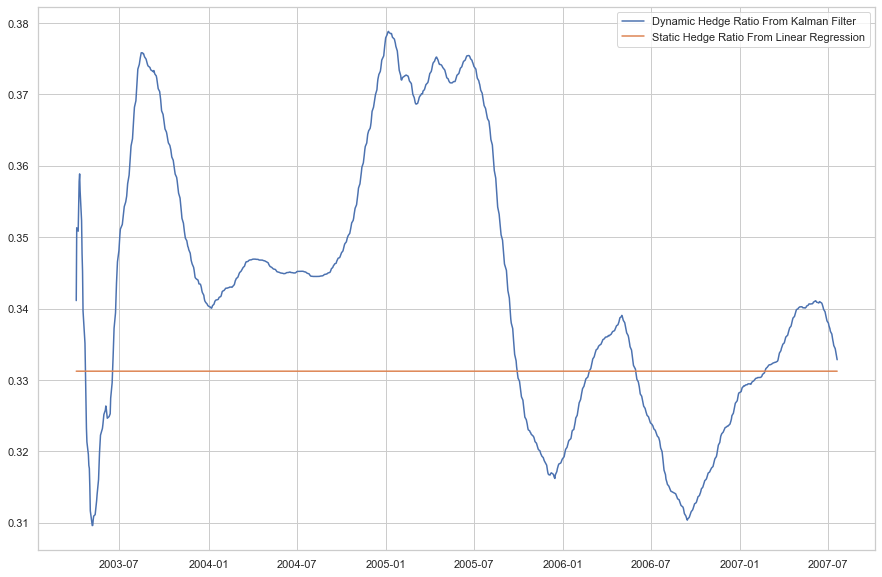

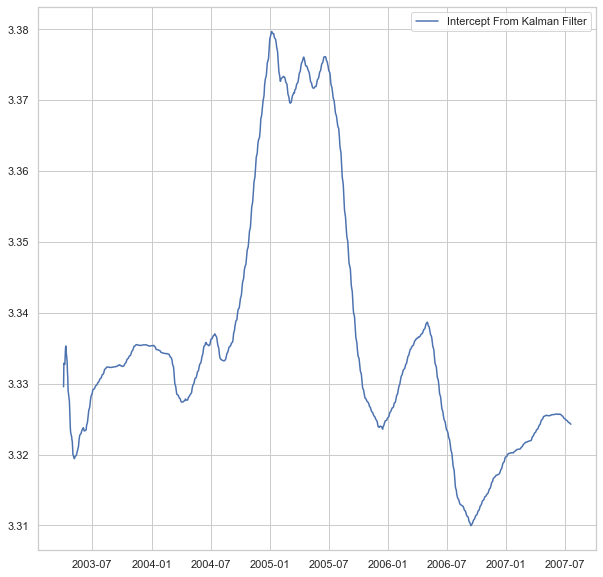

in backetester
(1082, 9)
(1023, 12)


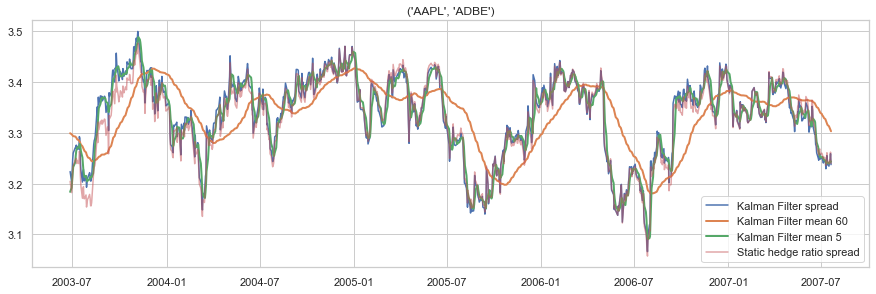

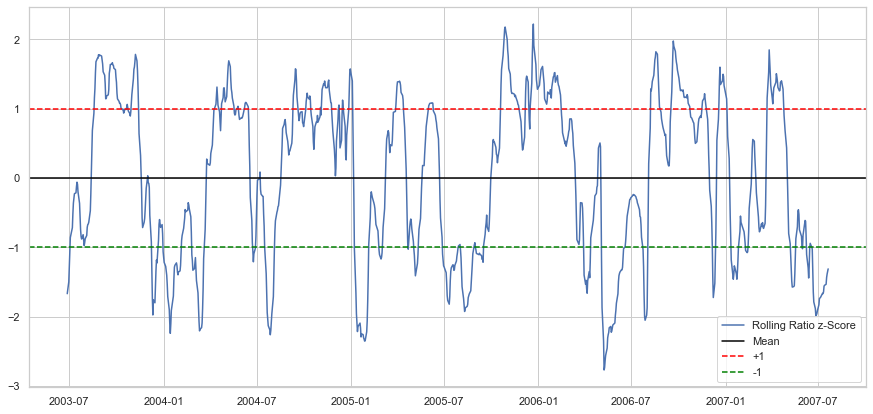

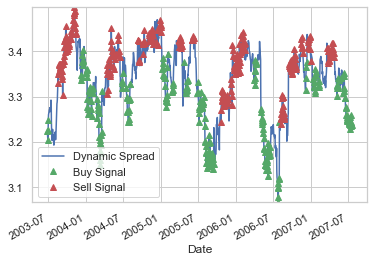

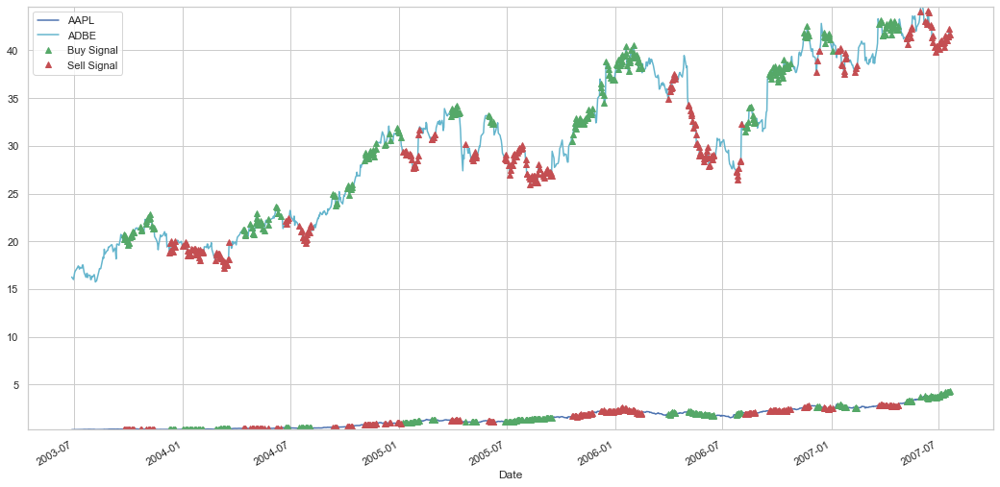

 25%|██▌       | 1/4 [00:02<00:06,  2.32s/it]

('ADP', 'FISV')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


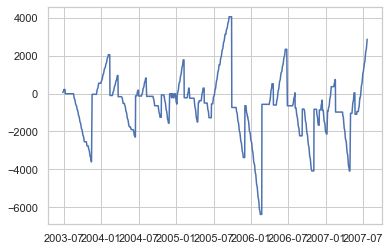

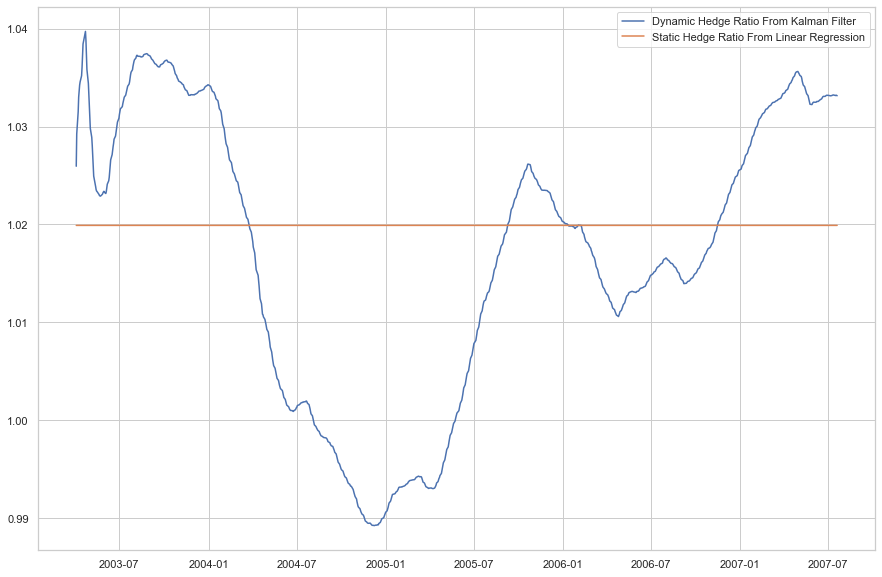

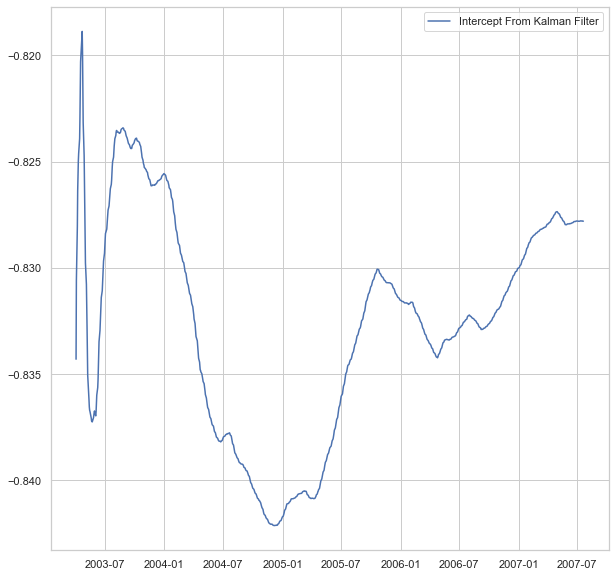

in backetester
(1082, 9)
(1023, 12)


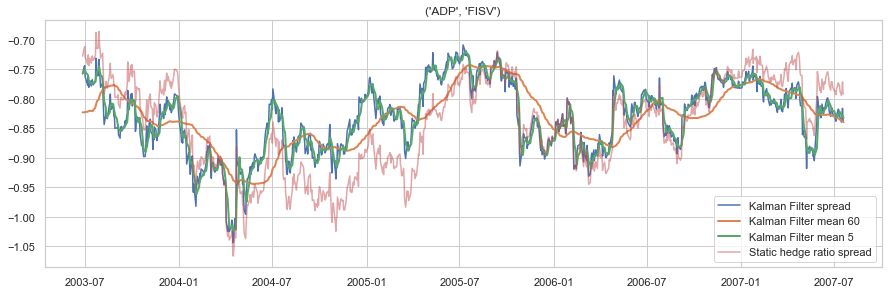

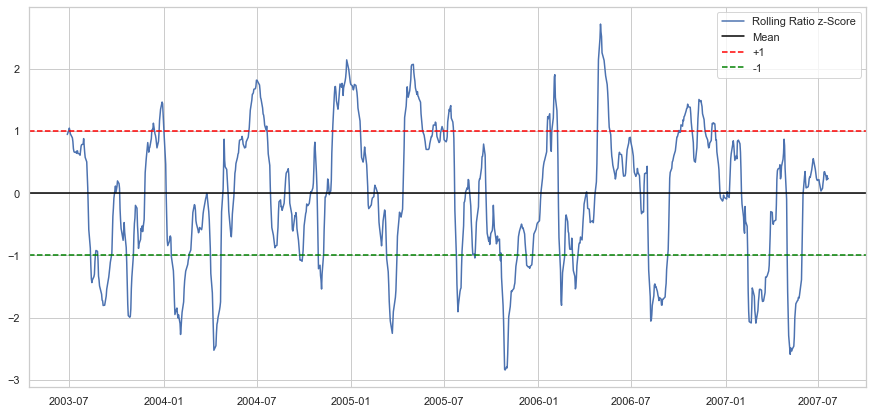

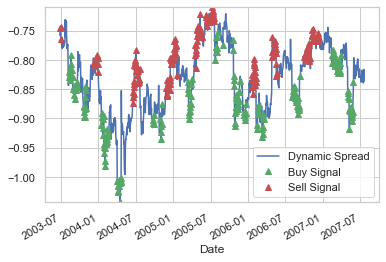

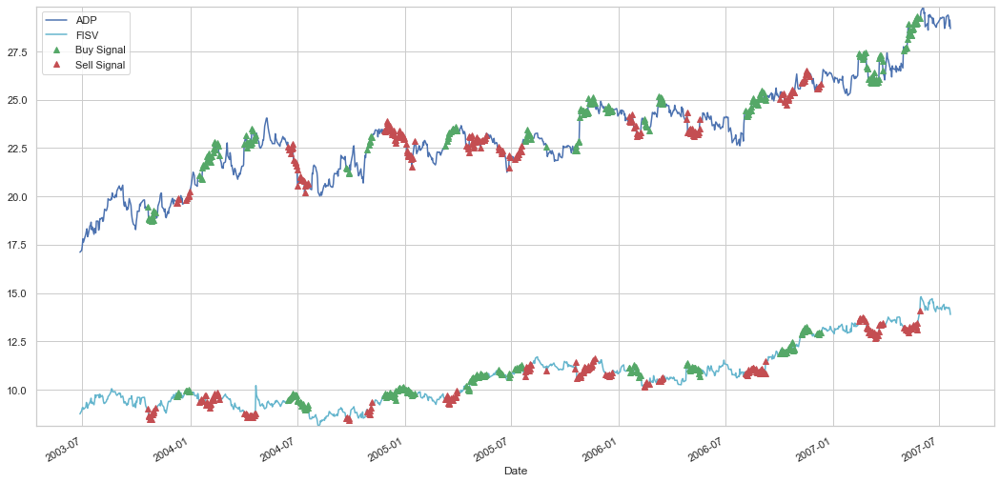

 50%|█████     | 2/4 [00:04<00:04,  2.25s/it]

('FISV', 'HPQ')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


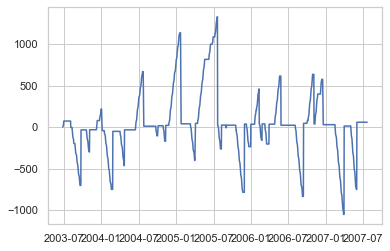

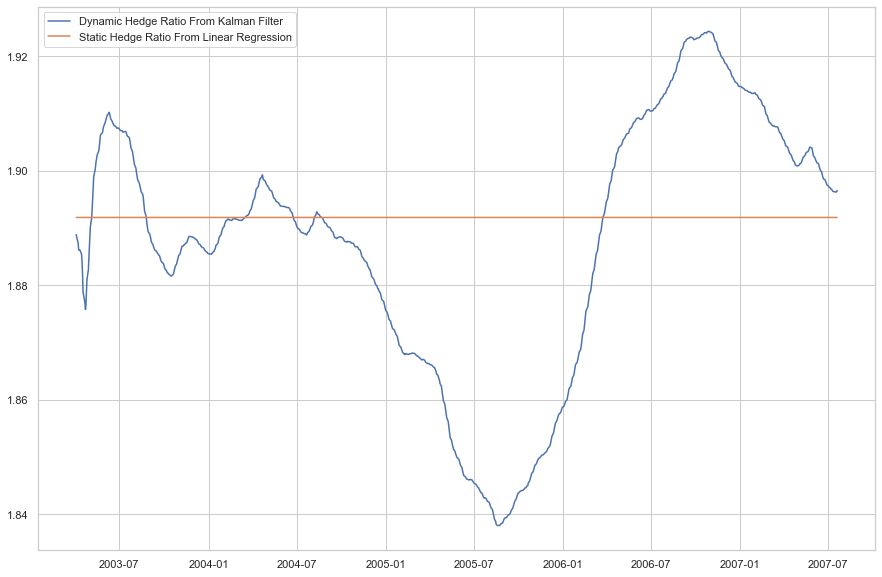

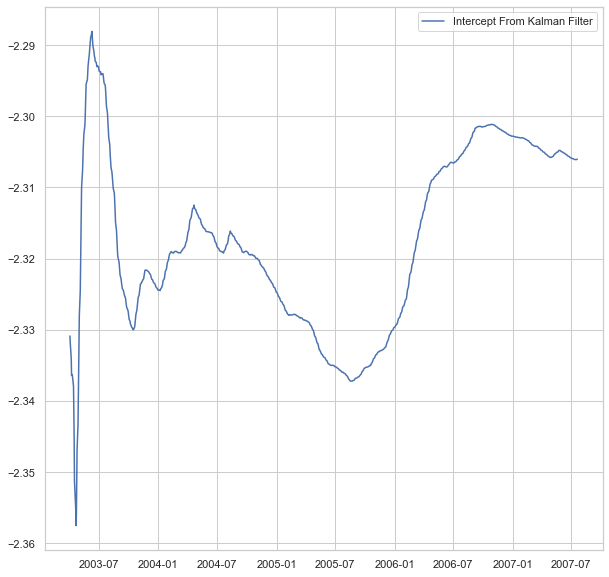

in backetester
(1082, 9)
(1023, 12)


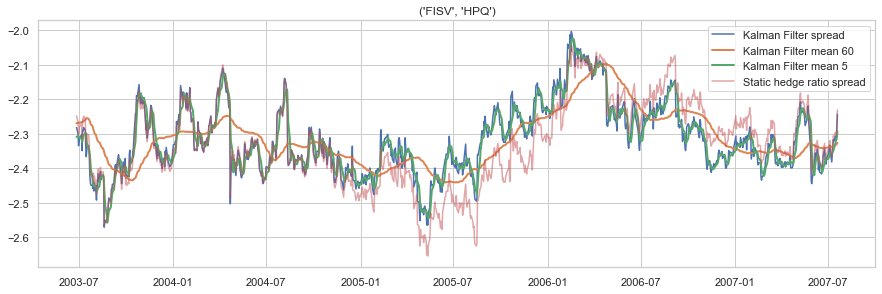

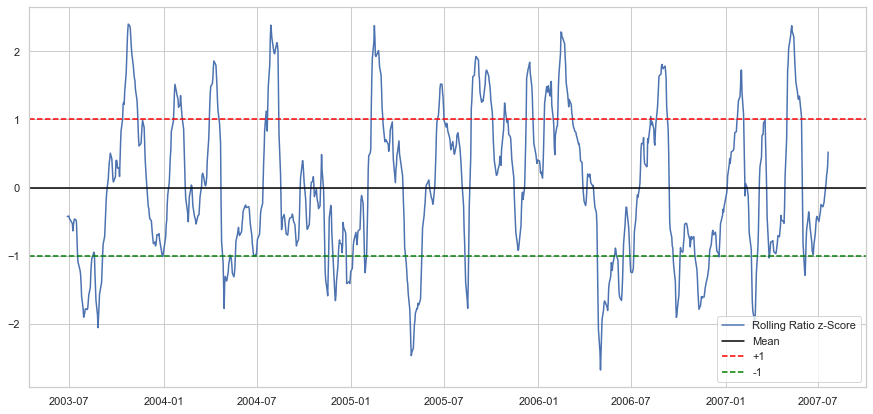

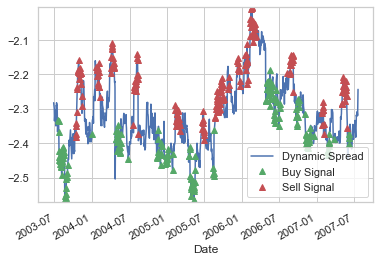

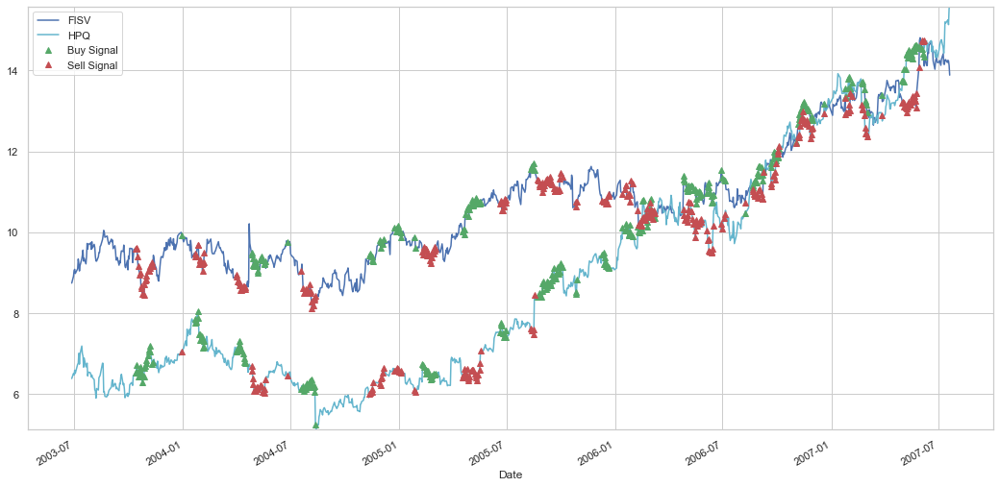

 75%|███████▌  | 3/4 [00:06<00:02,  2.26s/it]

('HPQ', 'NVDA')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


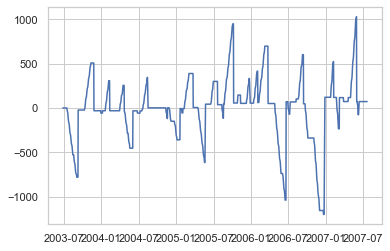

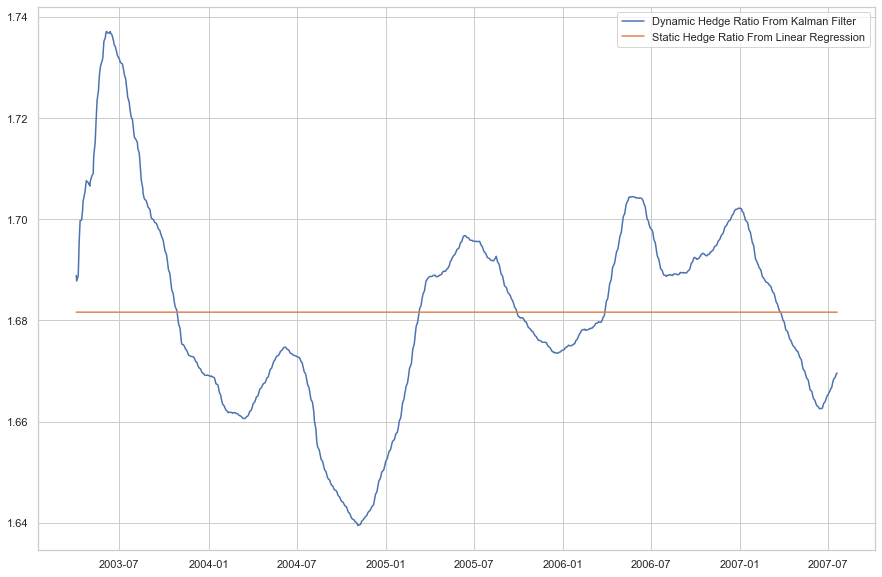

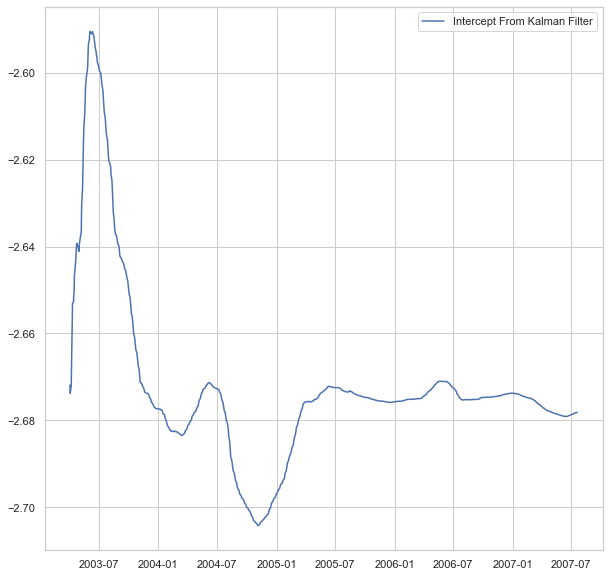

in backetester
(1082, 9)
(1023, 12)


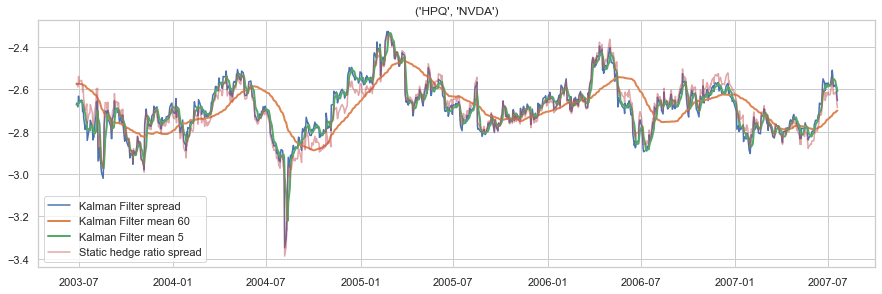

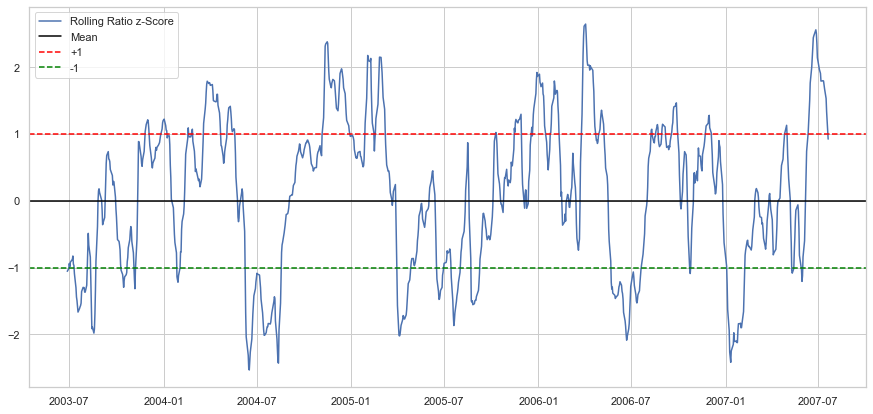

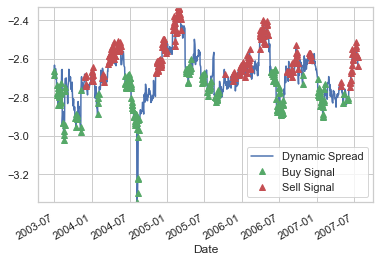

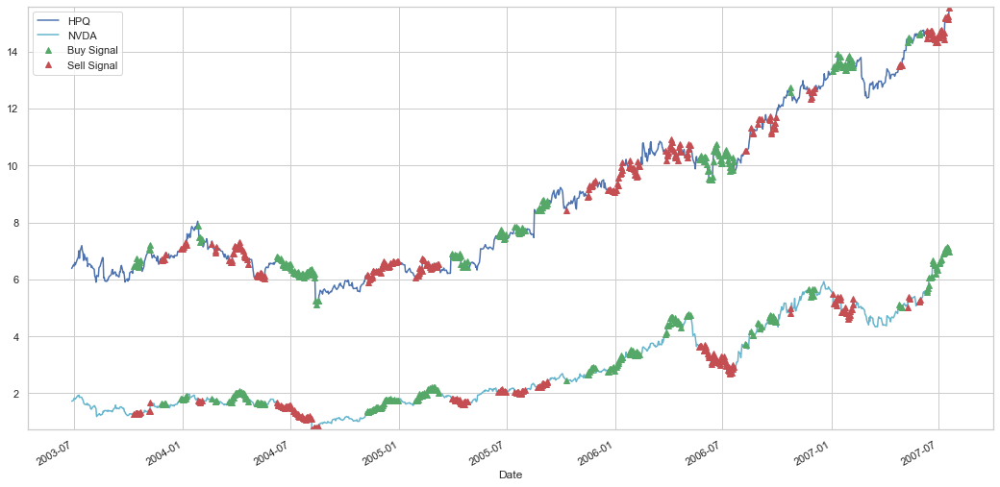

100%|██████████| 4/4 [00:09<00:00,  2.34s/it]


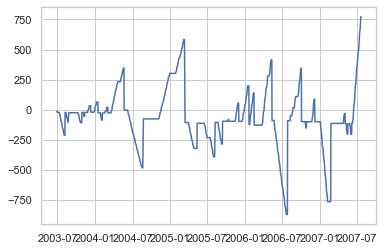

In [41]:
metrics={}
for i in tqdm(range(len(final_pairs))):
    tickers = final_pairs['Pairs'][i]
    print(tickers)
    metrics[tickers] = get_dynamic_and_static_HR(tickers , start_date , end_date , 'Log Price')

In [20]:
bull_metrics = pd.DataFrame.from_dict(metrics , orient='index').reset_index()
bull_metrics.columns = ['Pair1','Pair2','PNL','hit ratio','no_of_trades','return_portflio','max drawdown']

bull_metrics

,Pair1,Pair2,PNL,hit ratio,no_of_trades,return_portflio,max drawdown
0,AAPL,ADBE,2862.330096,0.538462,650,1184.831073,-4781.275577
1,ADP,FISV,58.622694,0.501031,485,-24.667672,-1308.270990
2,FISV,HPQ,72.088127,0.507338,477,183.415196,-954.798167
3,HPQ,NVDA,772.273138,0.534070,543,6929.253962,-690.286630


### Bear market

In [21]:
webpage = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
industry = "Information Technology"
start_date = "2007-07-24"
end_date = "2009-07-16"
pval_threshold = 0.03

In [22]:
tickers = importData(start_date = start_date)
data = read_data(tickers, start=start_date, end=end_date, ohlc = "Adj Close")
rets = calc_returns(data)
rets.head()

[*********************100%***********************]  23 of 23 completed


,AAPL,ADBE,ADI,ADP,ADSK,AKAM,AMAT,CSCO,CTSH,FIS,...,INTC,INTU,JNPR,MSFT,MU,NLOK,NTAP,NVDA,ORCL,VRSN
Date,,,,,,,,,,,,,,,,,,,,,
2007-07-25,0.012316,-0.000385,0.000591,-0.002162,-0.001013,0.005193,0.007332,0.001648,-0.003906,-0.005807,...,-0.000446,0.001011,0.015558,-0.000940,0.000897,0.010539,0.002423,-0.002479,-0.001024,0.003319
2007-07-26,0.043118,-0.003427,-0.006987,-0.005096,-0.003247,-0.054309,-0.002465,-0.002636,-0.002598,-0.013736,...,-0.007513,-0.006213,-0.010194,-0.007732,-0.029096,0.004646,-0.007514,0.002603,-0.009889,-0.006553
2007-07-27,-0.009934,-0.005275,-0.004106,-0.004281,-0.002072,-0.011419,-0.000662,-0.007834,-0.000540,-0.011752,...,-0.007105,-0.004906,-0.007852,-0.006438,-0.009038,-0.017509,-0.011710,-0.001297,-0.006999,-0.013010
2007-07-30,-0.011475,0.003326,0.004210,0.004102,0.003290,-0.004574,0.007542,0.005883,0.006795,0.002013,...,0.004837,0.000212,0.006898,0.000111,0.005092,-0.003333,0.007311,0.014451,-0.000731,0.003452
2007-07-31,-0.048456,-0.003983,-0.005337,0.002282,-0.008962,-0.017116,0.000322,-0.006530,-0.009071,-0.007600,...,-0.003566,-0.003934,-0.006954,-0.004578,-0.005066,-0.002848,-0.017128,0.003050,-0.008520,-0.001559


In [23]:
rets.tail()

,AAPL,ADBE,ADI,ADP,ADSK,AKAM,AMAT,CSCO,CTSH,FIS,...,INTC,INTU,JNPR,MSFT,MU,NLOK,NTAP,NVDA,ORCL,VRSN
Date,,,,,,,,,,,,,,,,,,,,,
2009-07-09,-0.004392,0.010763,0.008486,-0.002698,0.015027,-0.001886,0.009956,0.000862,-0.001421,0.000185,...,0.002113,0.002536,0.002507,-0.001877,0.042488,0.005189,0.012369,0.025578,-0.004302,0.004273
2009-07-10,0.011029,0.001757,-0.001169,0.000582,0.000783,0.005639,0.002116,0.003641,0.014626,0.000739,...,0.000525,0.002054,0.000732,-0.000787,0.004911,0.009103,0.003856,0.004477,0.002944,-0.001817
2009-07-13,0.018881,0.008514,0.004657,0.003657,0.003304,0.007881,0.017363,0.004855,0.008493,0.007659,...,0.011648,0.003612,0.000730,0.012997,0.015623,-0.001075,0.015343,0.013269,0.004793,0.003231
2009-07-14,-0.000335,-0.000738,-0.001298,0.003132,0.001539,0.002686,0.008691,0.003326,0.002913,-0.001076,...,0.008493,-0.002808,0.002468,-0.001804,0.012719,0.012074,0.000361,0.023624,-0.001526,0.007143
2009-07-15,0.021730,0.015951,0.010823,0.006247,0.007956,0.011541,0.025270,0.021663,0.010986,0.003755,...,0.028878,0.009472,0.024625,0.014928,0.028682,0.024444,0.015350,0.044770,0.014668,0.020666


100%|██████████| 23/23 [00:09<00:00,  2.37it/s]


<AxesSubplot:>

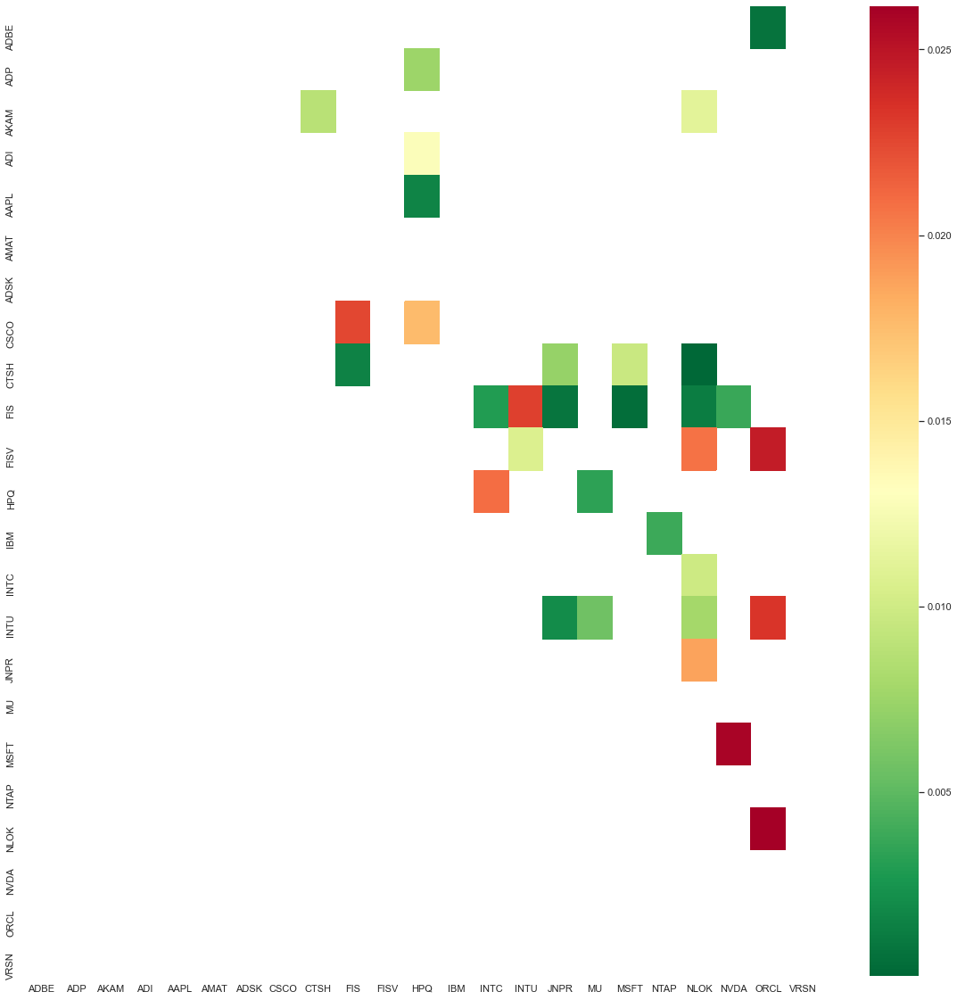

In [24]:
scores, pvalues, pairs = find_cointegrated_pairs(data , pval_threshold = pval_threshold)

fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(pvalues, xticklabels=tickers, yticklabels=tickers, cmap='RdYlGn_r' 
                , mask = (pvalues >= pval_threshold))

In [25]:
pairs

[('AAPL', 'ORCL', 0.0006769142184348723),
 ('ADBE', 'HPQ', 0.0075072826013029064),
 ('ADI', 'CTSH', 0.008823436987336258),
 ('ADI', 'NTAP', 0.011188318376988617),
 ('ADP', 'HPQ', 0.012809198439973761),
 ('ADSK', 'HPQ', 0.0016281662851218054),
 ('CSCO', 'FIS', 0.022570855381370287),
 ('CSCO', 'HPQ', 0.017619942497625232),
 ('CTSH', 'FIS', 0.0015027700367550299),
 ('CTSH', 'JNPR', 0.007270115937750906),
 ('CTSH', 'MU', 0.009685675576010513),
 ('CTSH', 'NTAP', 5.199477732522792e-05),
 ('FIS', 'INTC', 0.0029266873986997398),
 ('FIS', 'INTU', 0.022889523988563143),
 ('FIS', 'JNPR', 0.0008558524708101376),
 ('FIS', 'MU', 0.00042468381822797564),
 ('FIS', 'NTAP', 0.0012356590678158099),
 ('FIS', 'NVDA', 0.0037281206666857827),
 ('FISV', 'INTU', 0.010708814213897211),
 ('FISV', 'NTAP', 0.0206805662918582),
 ('FISV', 'ORCL', 0.024541781849381997),
 ('HPQ', 'INTC', 0.020915983785831375),
 ('HPQ', 'MSFT', 0.003363686132037409),
 ('IBM', 'NLOK', 0.0038294918674561394),
 ('INTC', 'NTAP', 0.00988078

In [26]:
final_pairs = checking_corr(pairs, data, corr_threshold = 0.90)
# final_pairs = pd.DataFrame([final_pairs])

There are 19 pairs with correlation more than 0.9.


In [27]:
final_pairs = pd.DataFrame.from_dict(final_pairs , orient='index').reset_index()
final_pairs.columns=['Pairs','Correlation_score','Cointegration_score']

In [28]:
final_pairs

,Pairs,Correlation_score,Cointegration_score
0,"(AAPL, ORCL)",0.917,0.000677
1,"(ADBE, HPQ)",0.937,0.007507
2,"(ADI, CTSH)",0.936,0.008823
3,"(ADI, NTAP)",0.937,0.011188
4,"(ADSK, HPQ)",0.948,0.001628
5,"(CSCO, FIS)",0.903,0.022571
6,"(CSCO, HPQ)",0.932,0.017620
7,"(CTSH, FIS)",0.944,0.001503
8,"(CTSH, JNPR)",0.922,0.007270
9,"(CTSH, MU)",0.923,0.009686


  0%|          | 0/19 [00:00<?, ?it/s]

('AAPL', 'ORCL')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


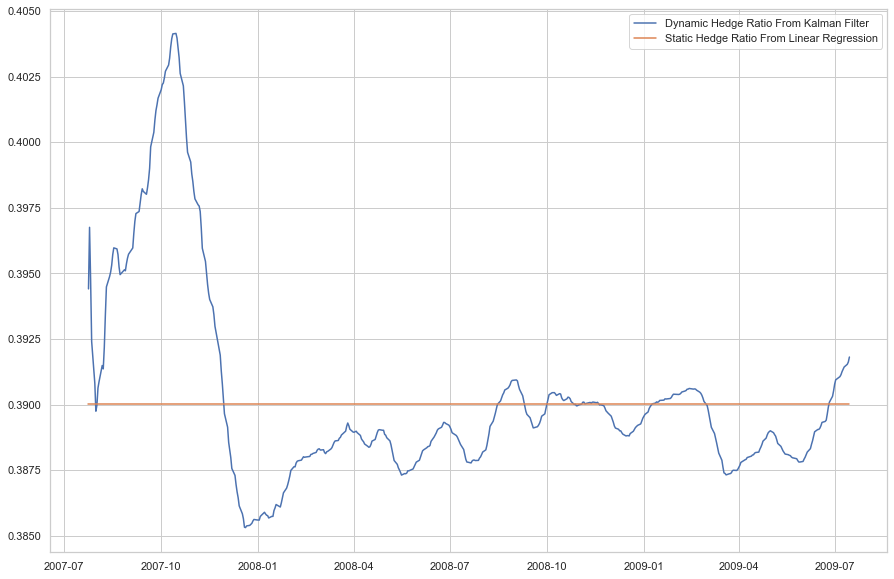

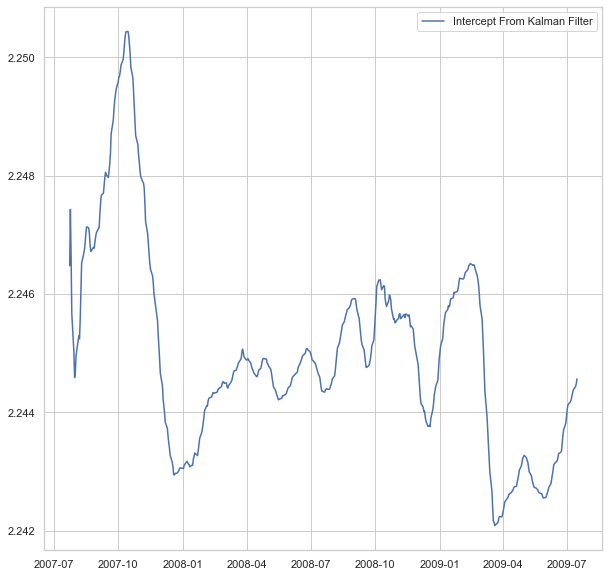

in backetester
(499, 9)
(440, 12)


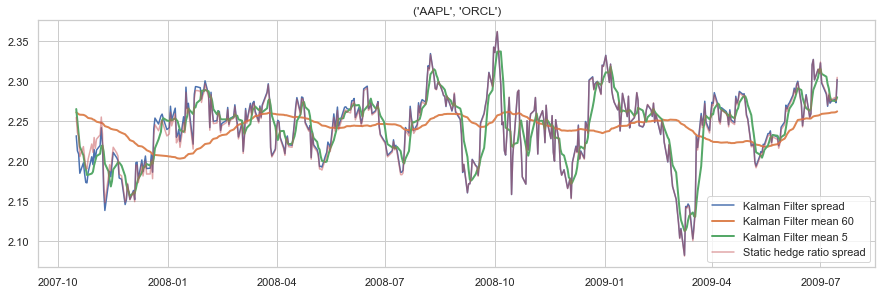

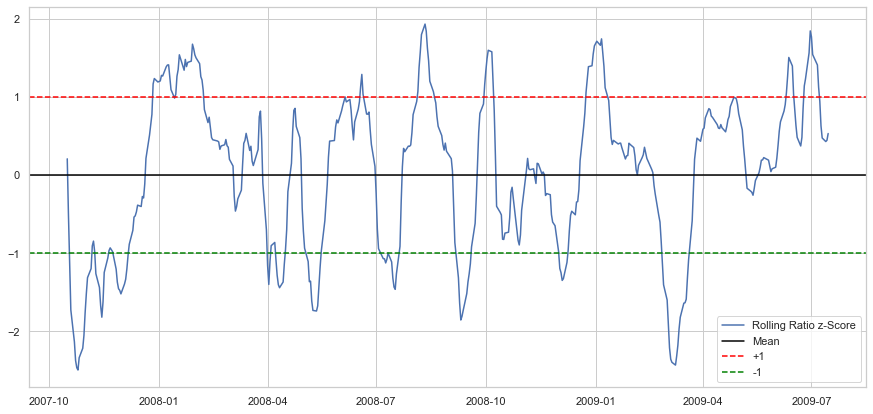

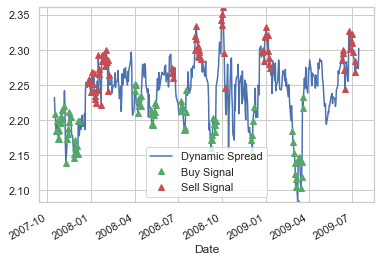

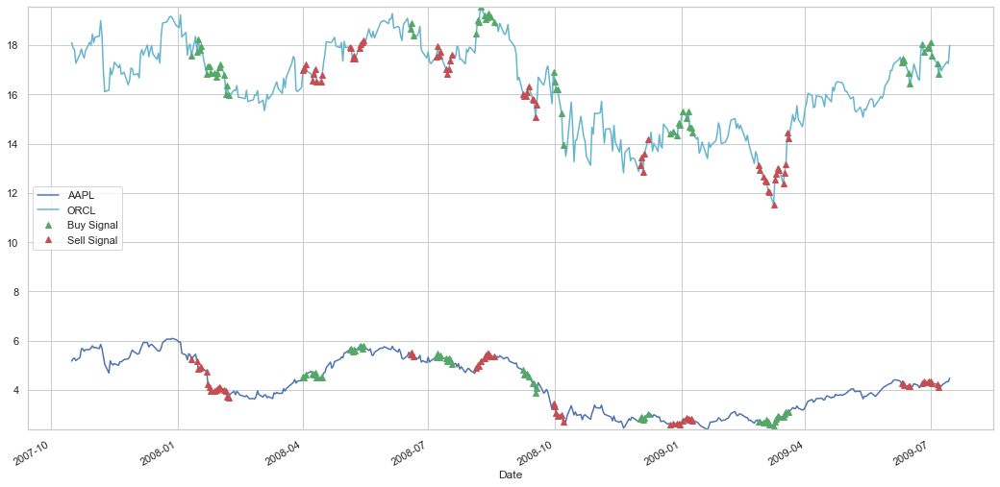

  5%|▌         | 1/19 [00:01<00:32,  1.80s/it]

('ADBE', 'HPQ')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


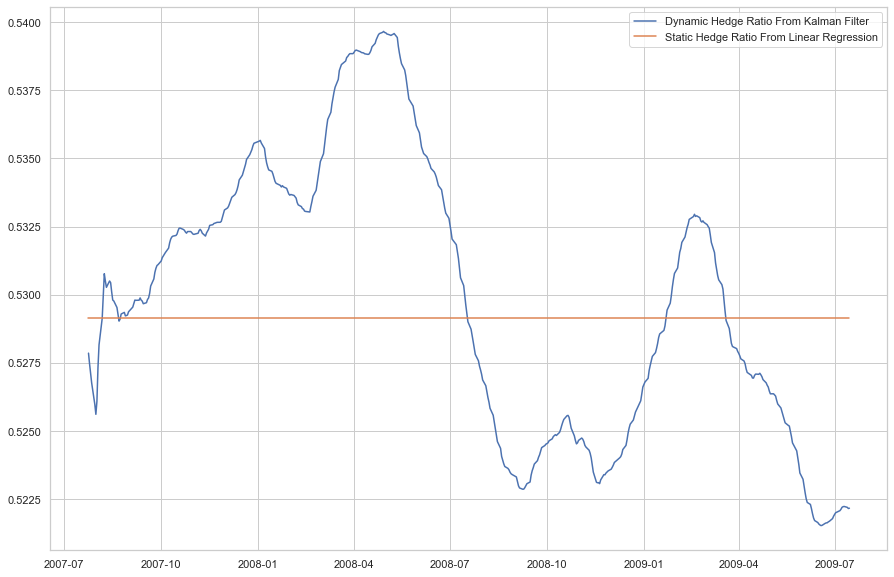

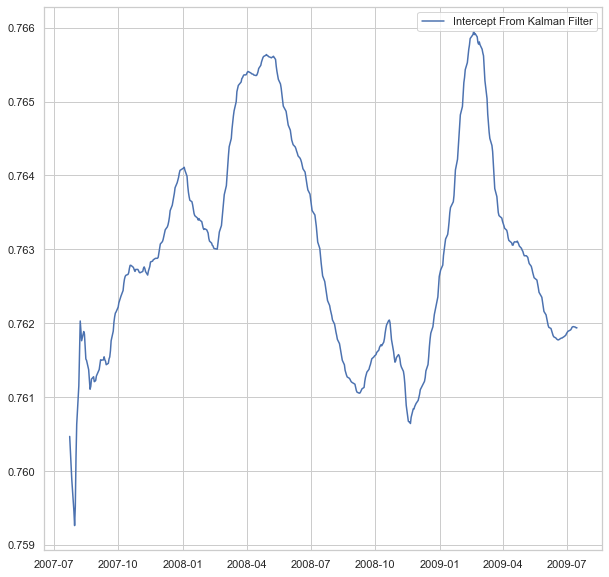

in backetester
(499, 9)
(440, 12)


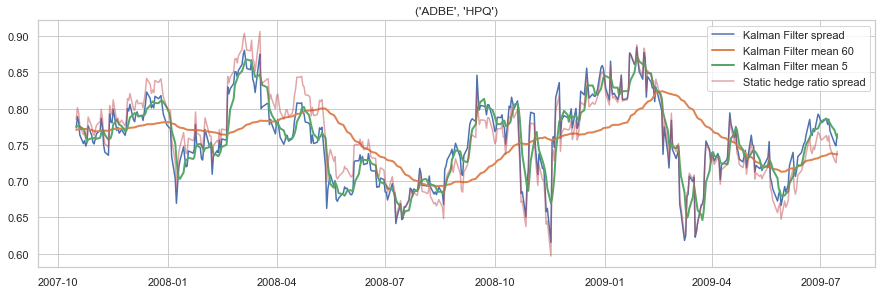

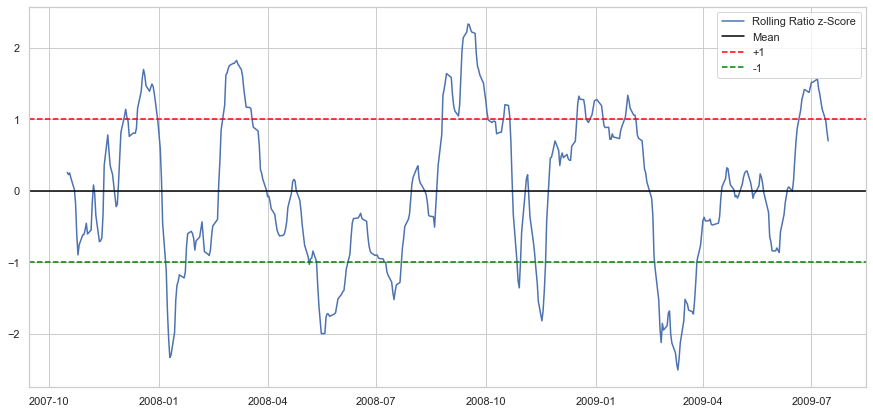

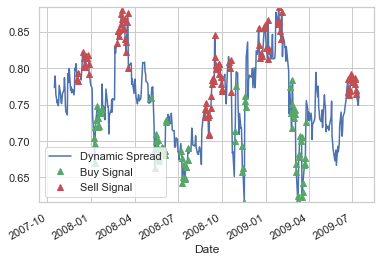

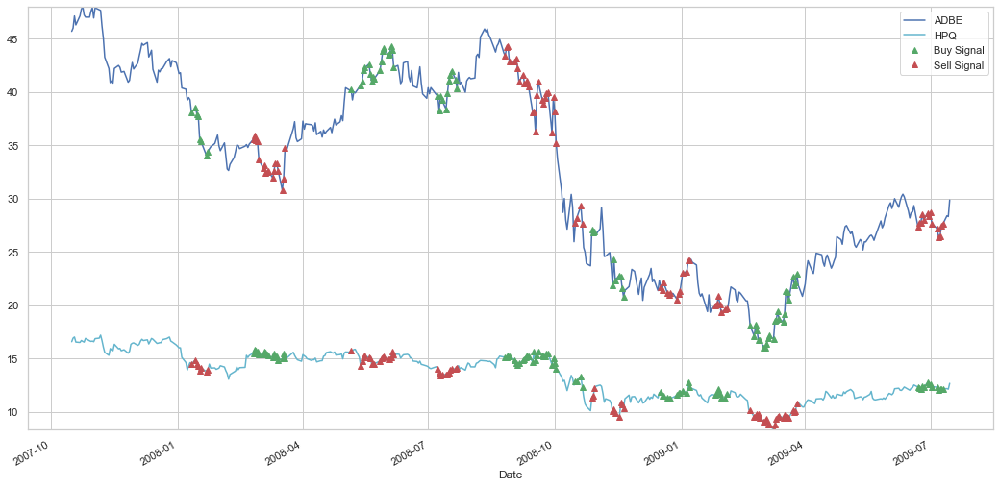

 11%|█         | 2/19 [00:03<00:29,  1.71s/it]

('ADI', 'CTSH')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


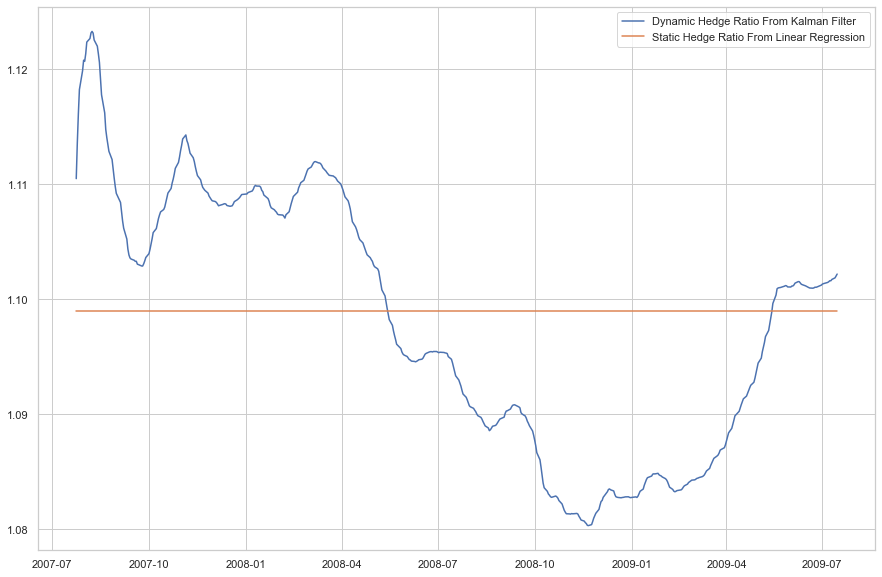

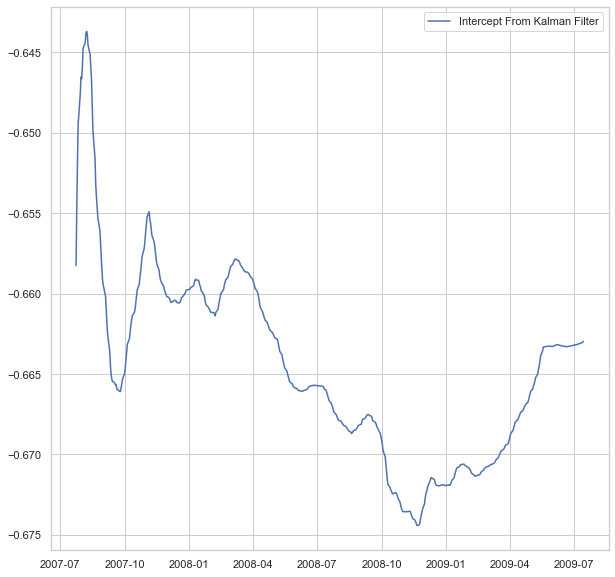

in backetester
(499, 9)
(440, 12)


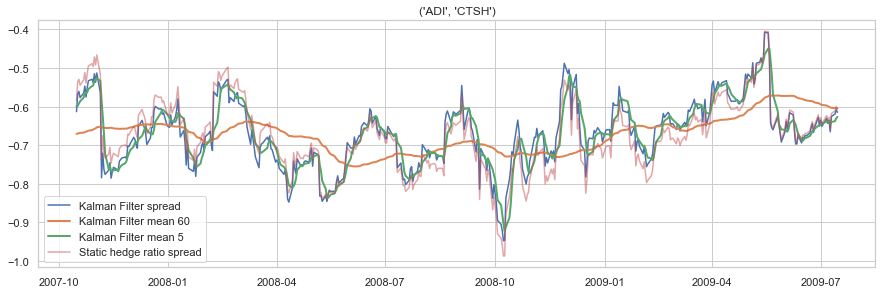

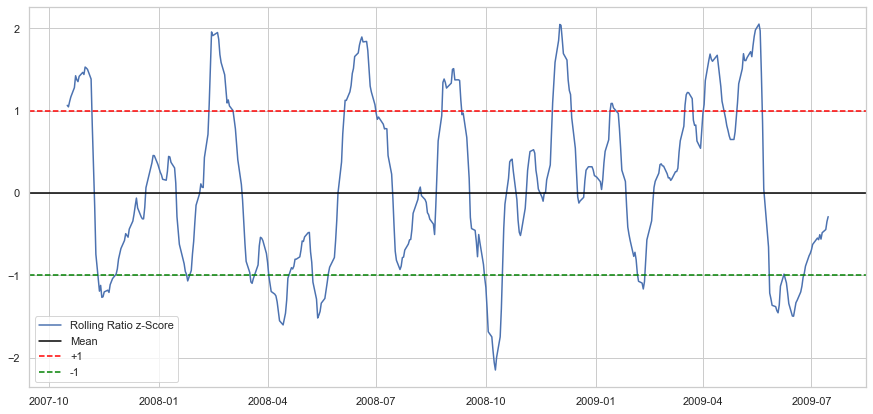

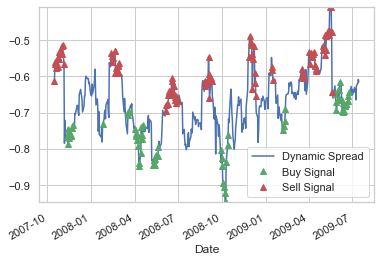

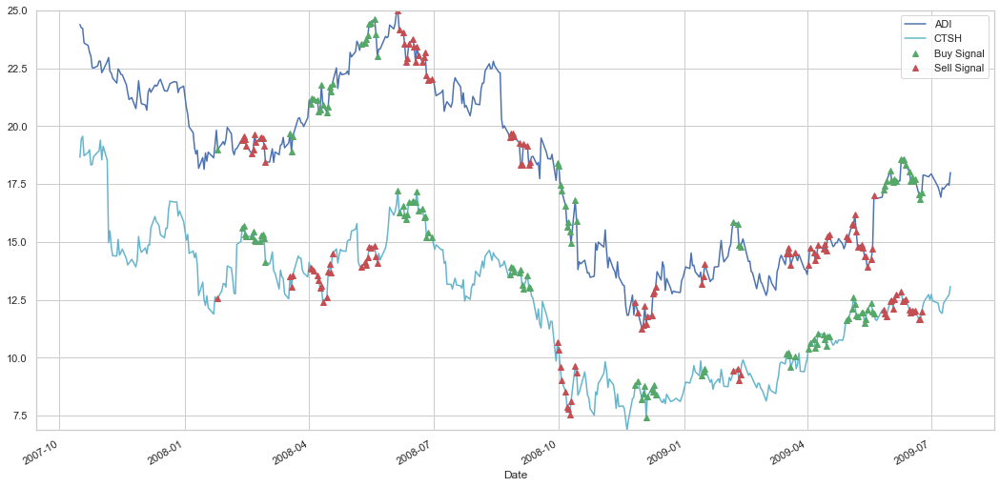

 16%|█▌        | 3/19 [00:05<00:27,  1.70s/it]

('ADI', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


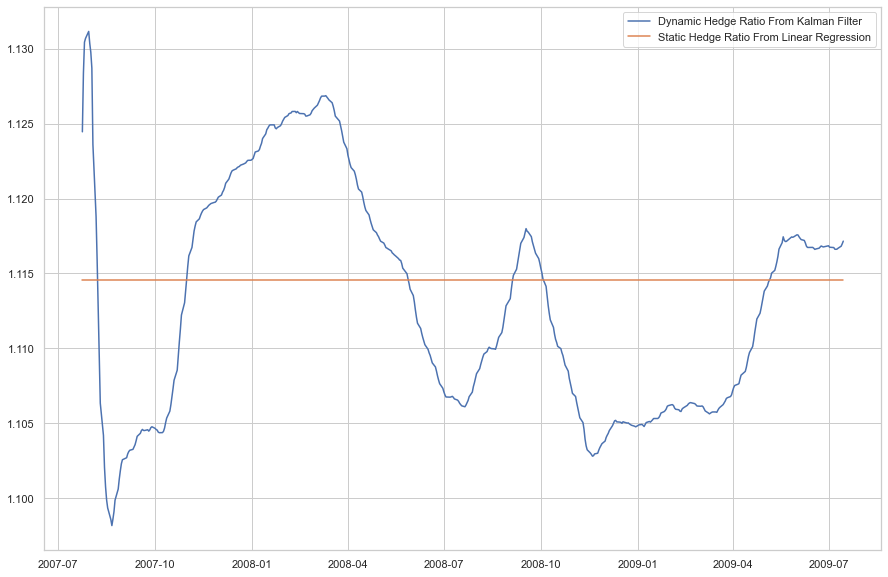

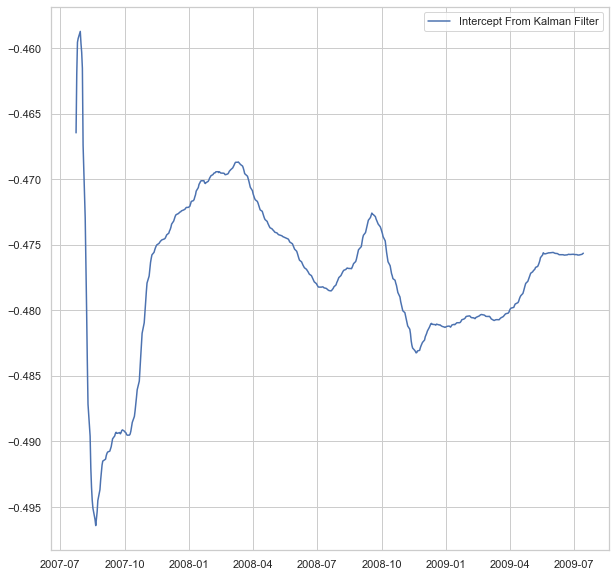

in backetester
(499, 9)
(440, 12)


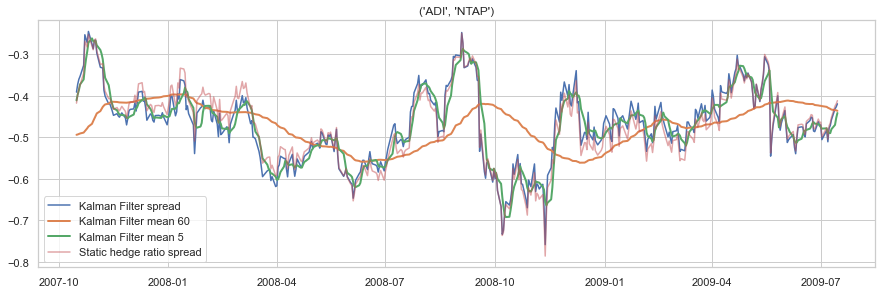

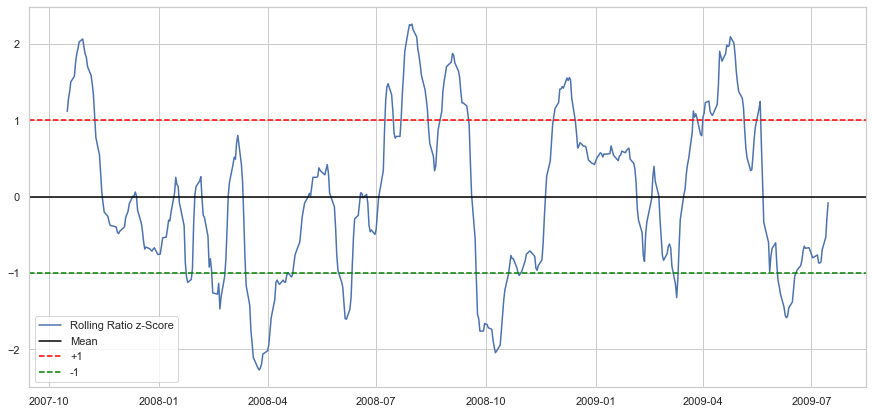

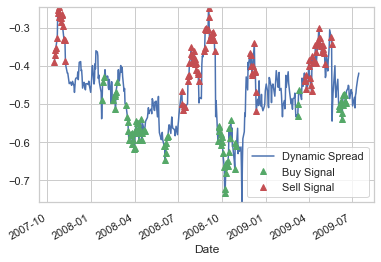

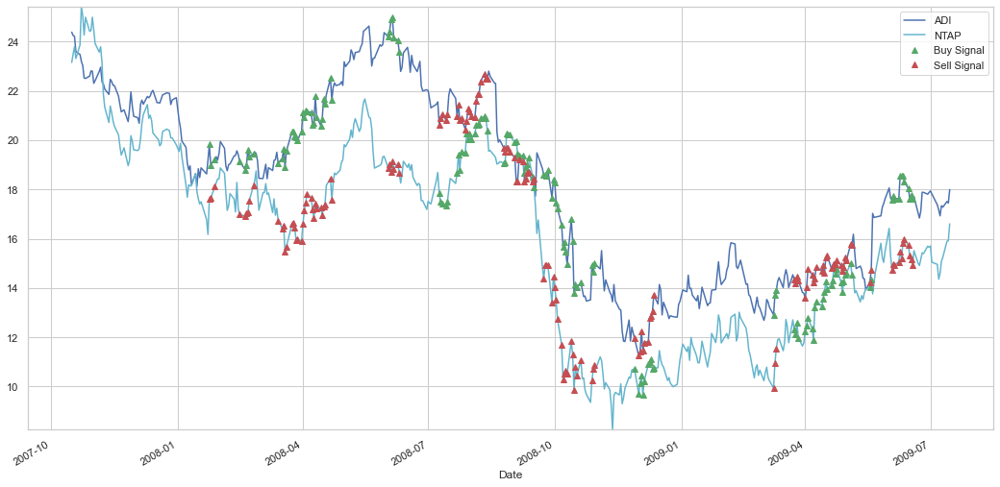

 21%|██        | 4/19 [00:06<00:24,  1.63s/it]

('ADSK', 'HPQ')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


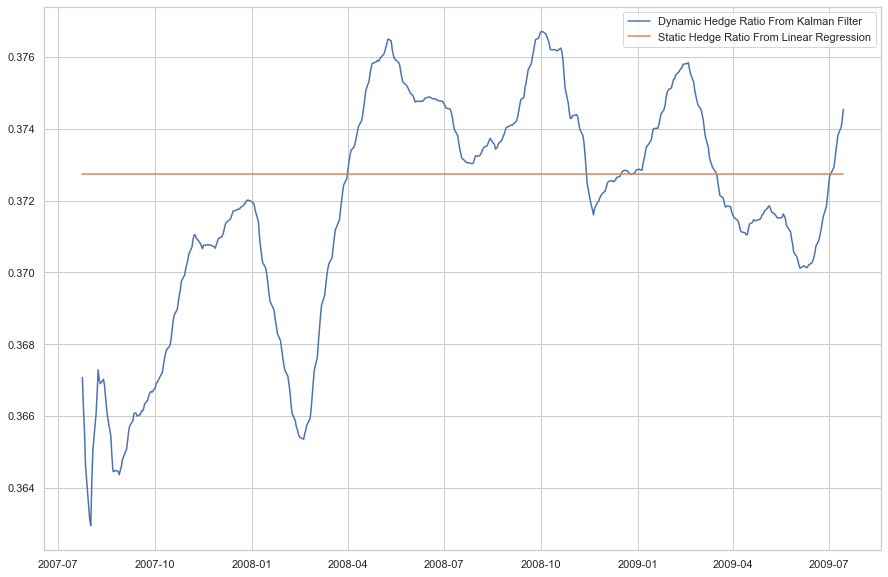

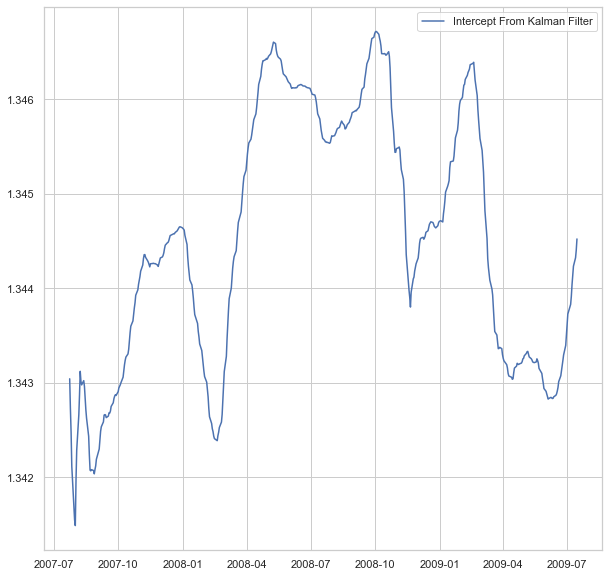

in backetester
(499, 9)
(440, 12)


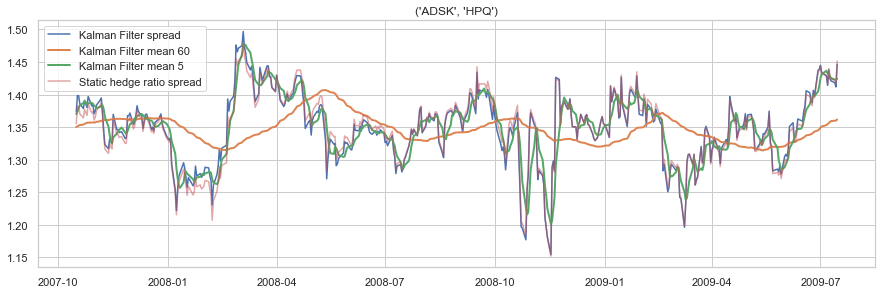

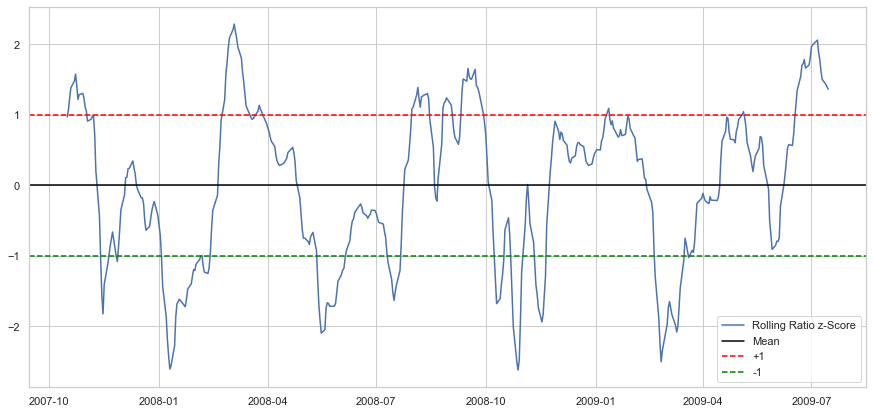

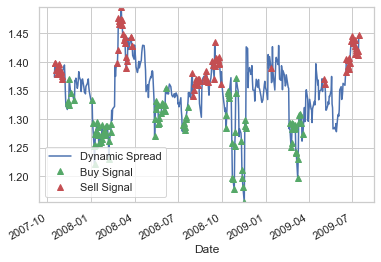

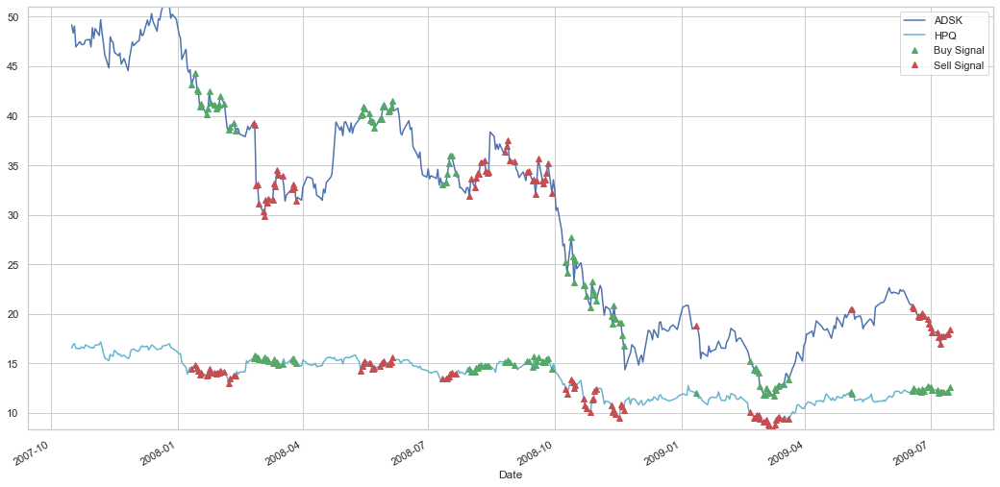

 26%|██▋       | 5/19 [00:08<00:22,  1.63s/it]

('CSCO', 'FIS')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


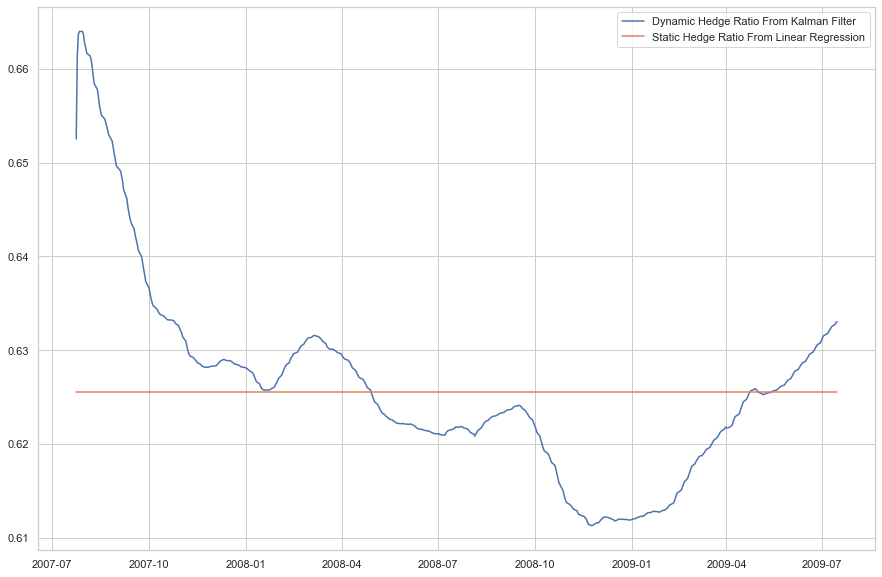

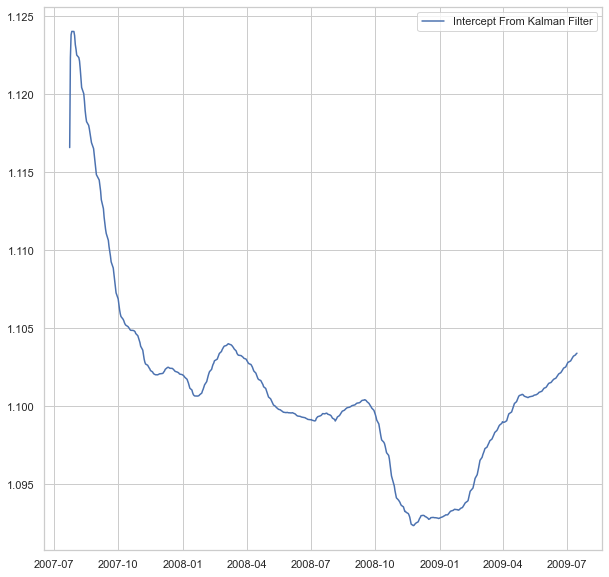

in backetester
(499, 9)
(440, 12)


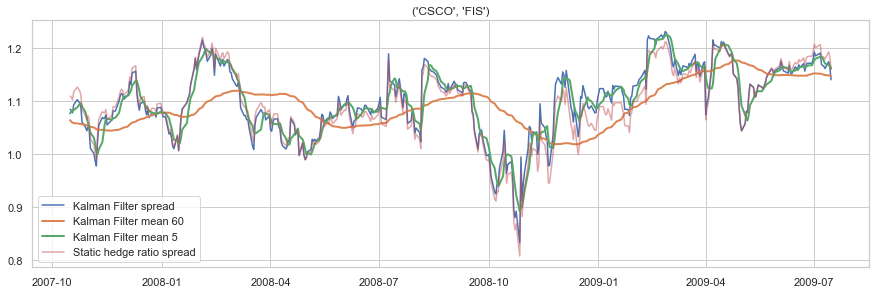

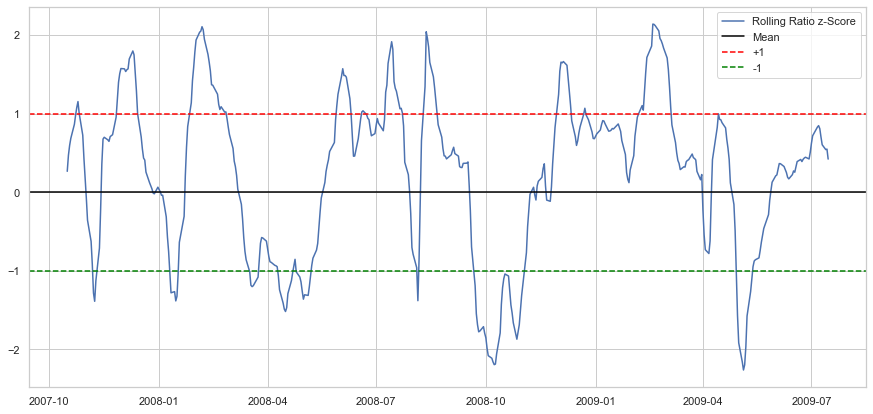

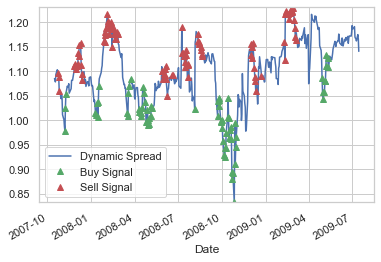

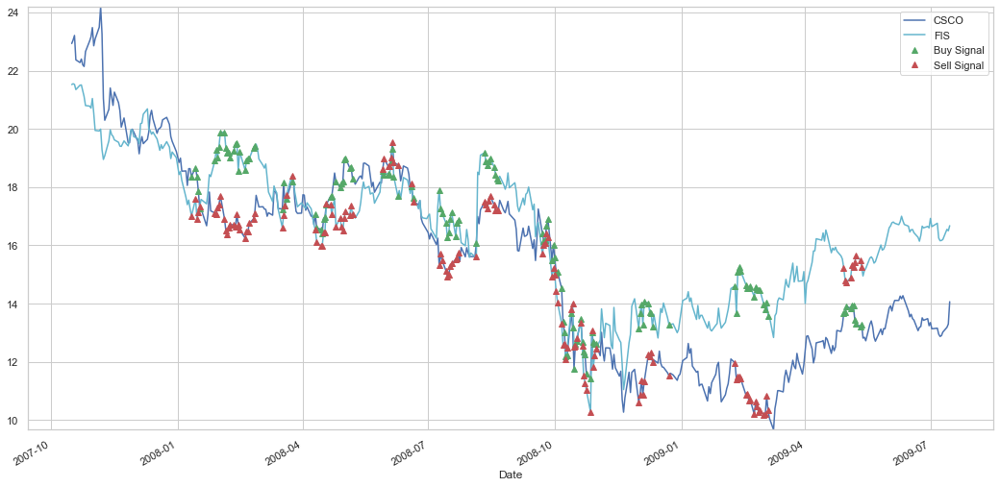

 32%|███▏      | 6/19 [00:09<00:21,  1.62s/it]

('CSCO', 'HPQ')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


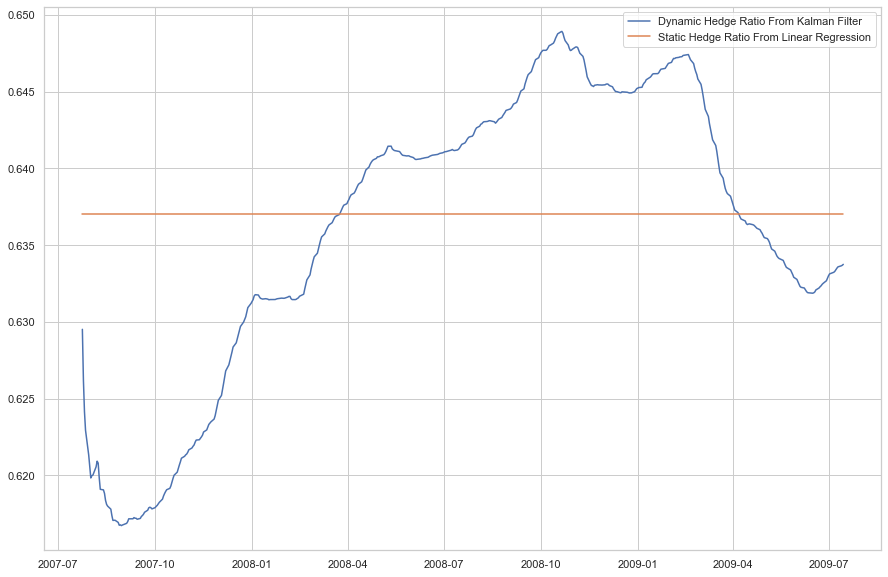

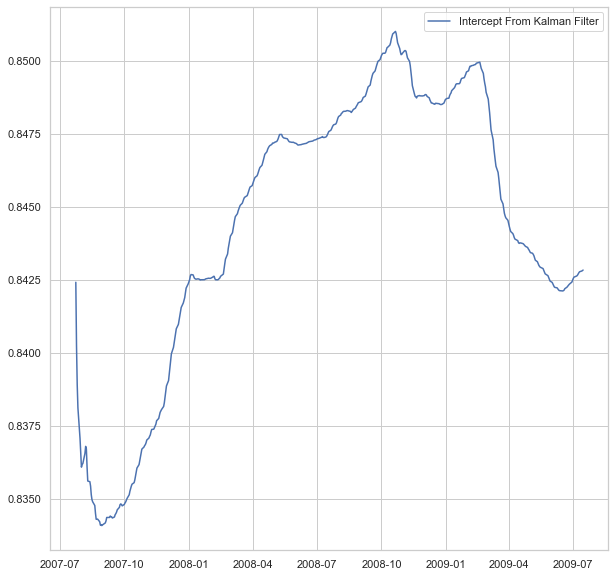

in backetester
(499, 9)
(440, 12)


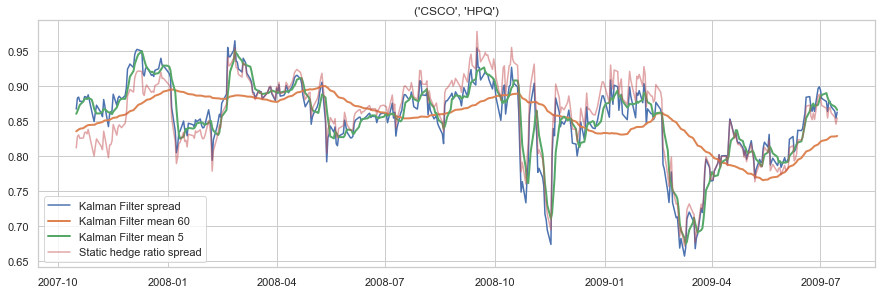

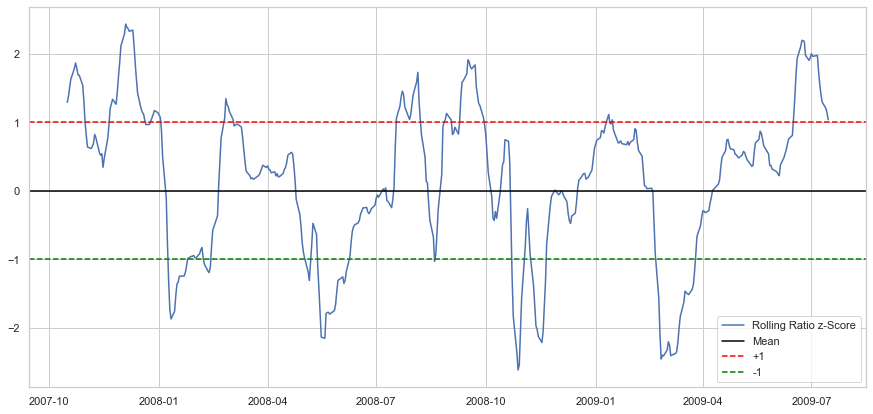

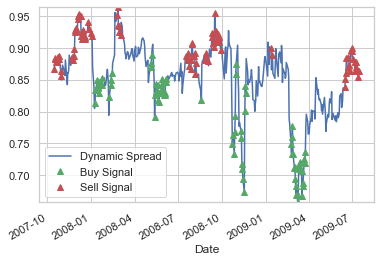

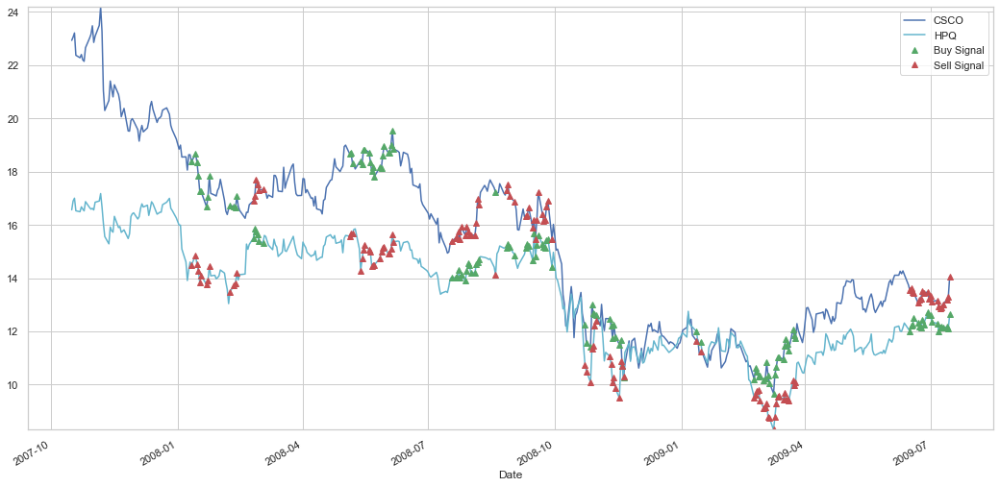

 37%|███▋      | 7/19 [00:11<00:19,  1.62s/it]

('CTSH', 'FIS')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


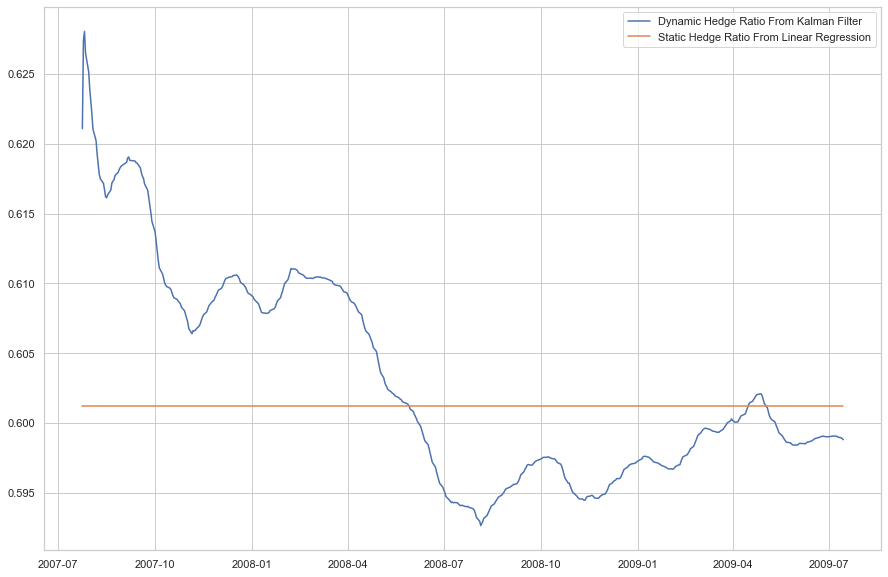

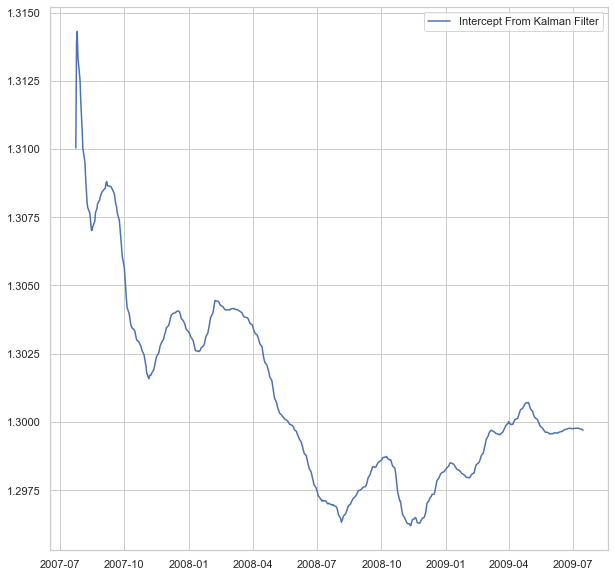

in backetester
(499, 9)
(440, 12)


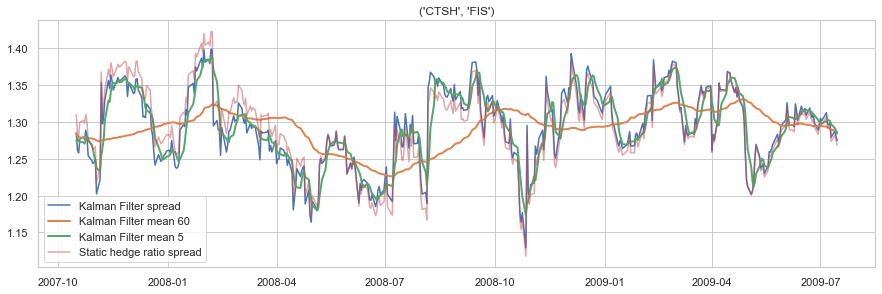

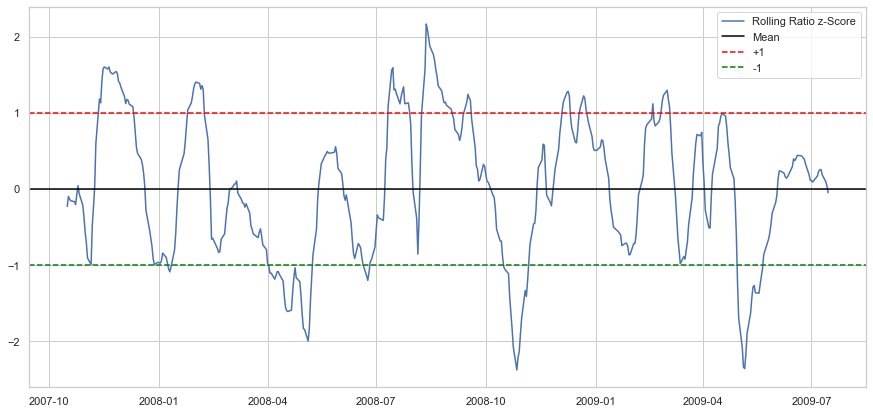

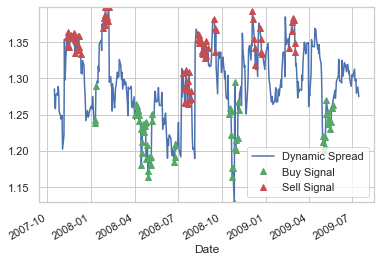

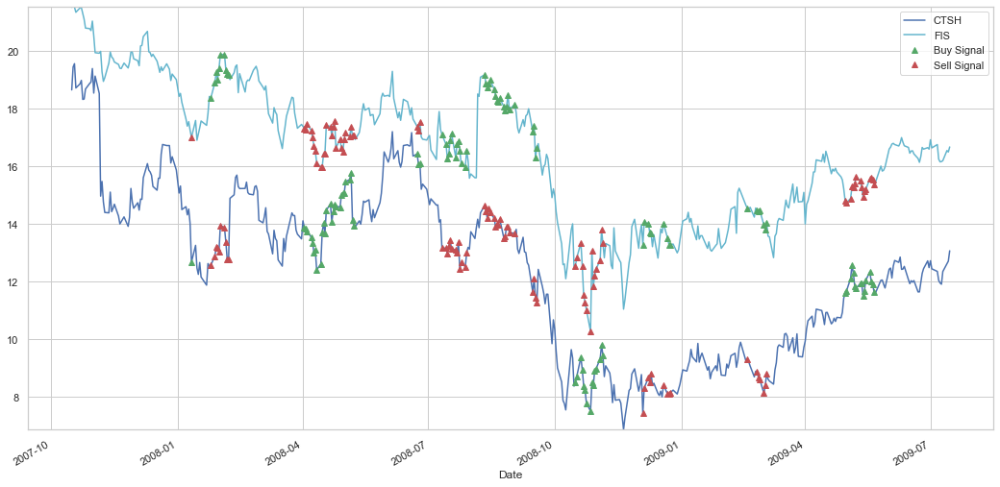

 42%|████▏     | 8/19 [00:13<00:17,  1.60s/it]

('CTSH', 'JNPR')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


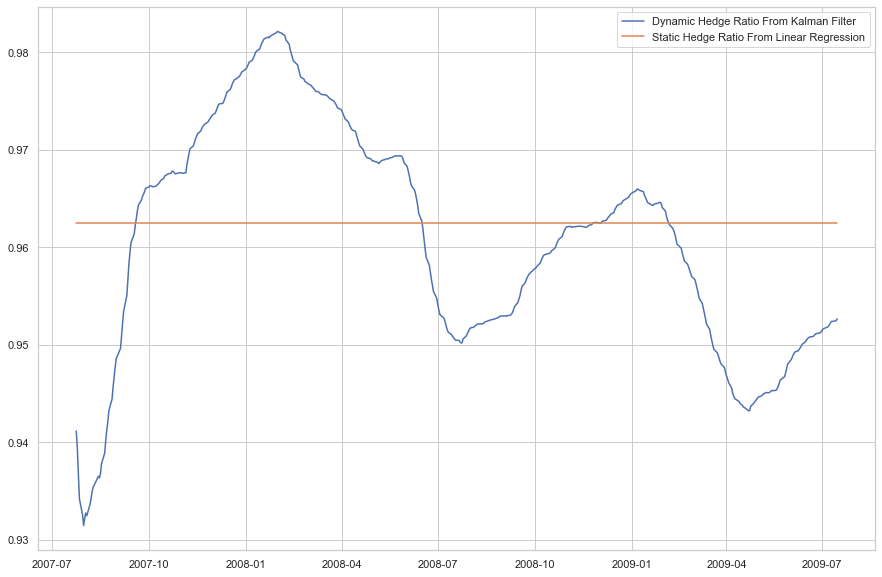

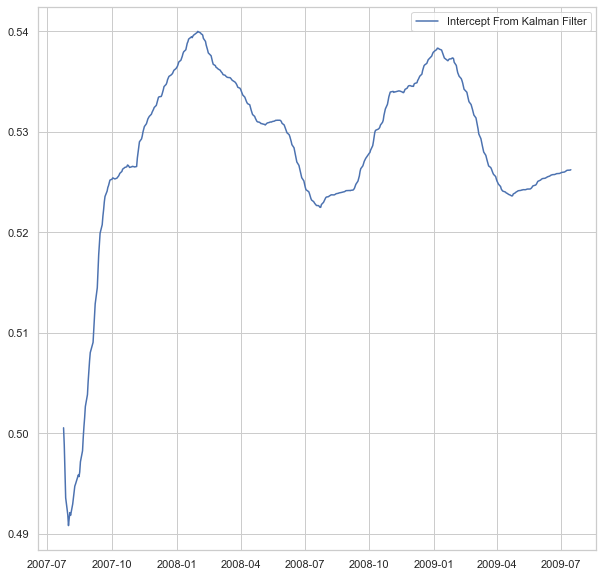

in backetester
(499, 9)
(440, 12)


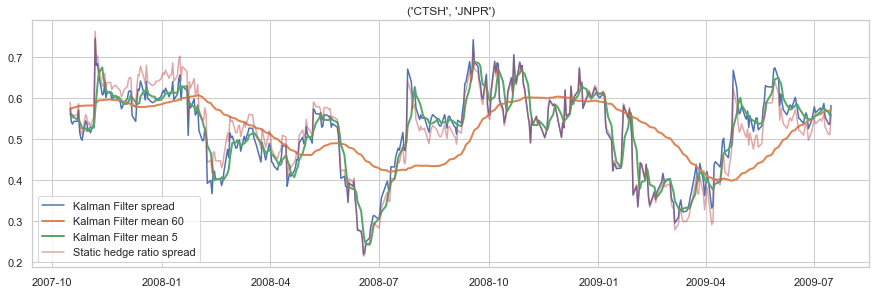

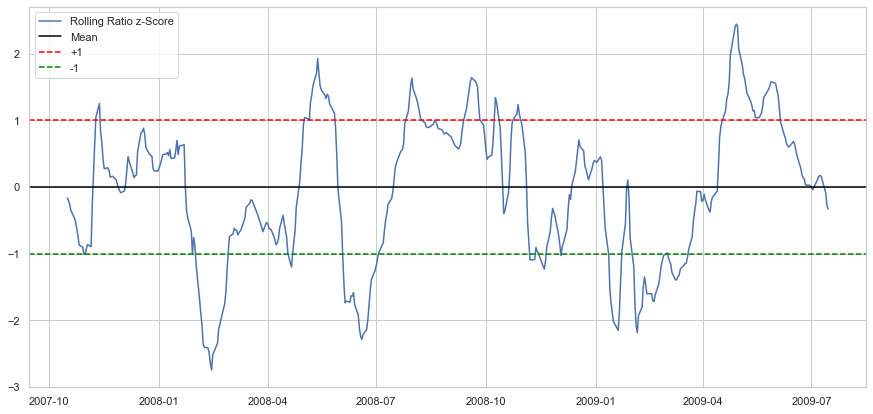

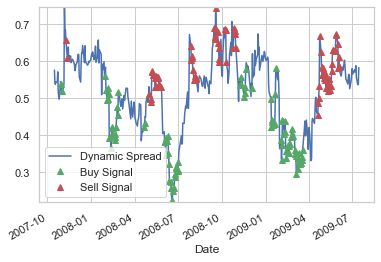

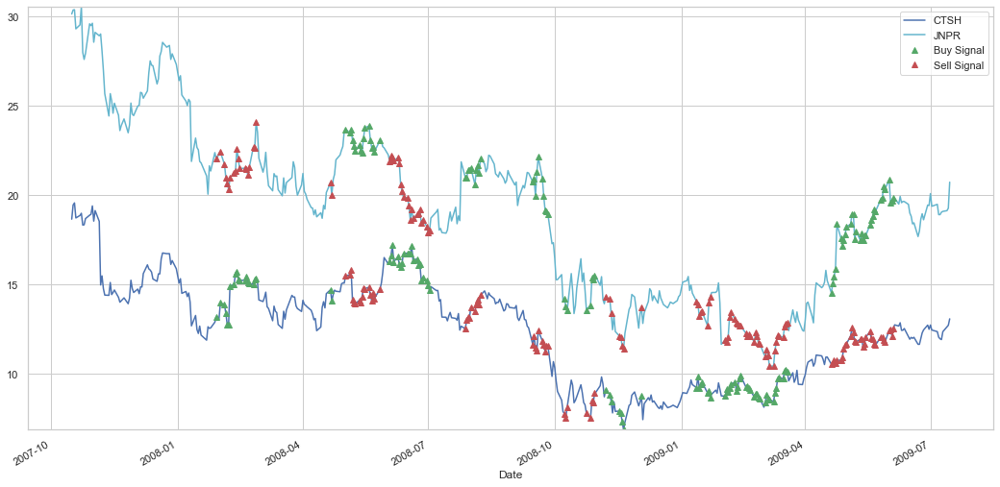

 47%|████▋     | 9/19 [00:14<00:15,  1.58s/it]

('CTSH', 'MU')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


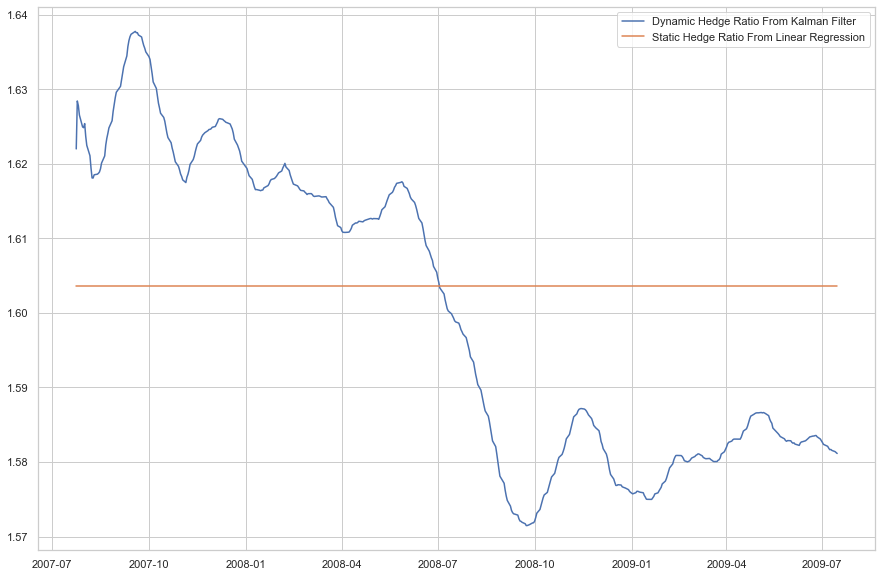

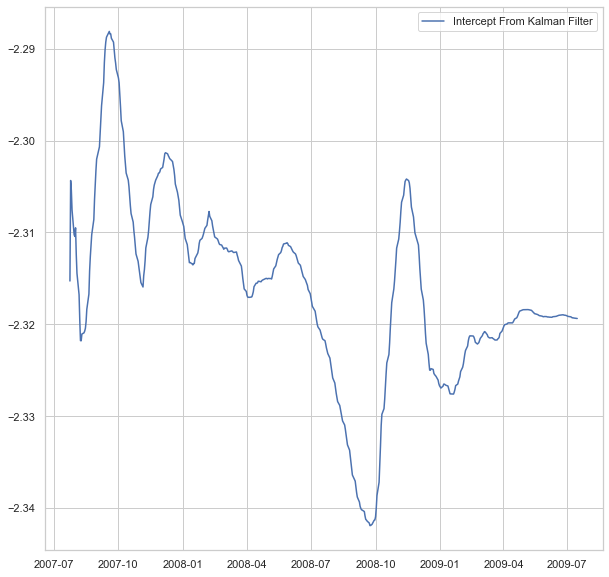

in backetester
(499, 9)
(440, 12)


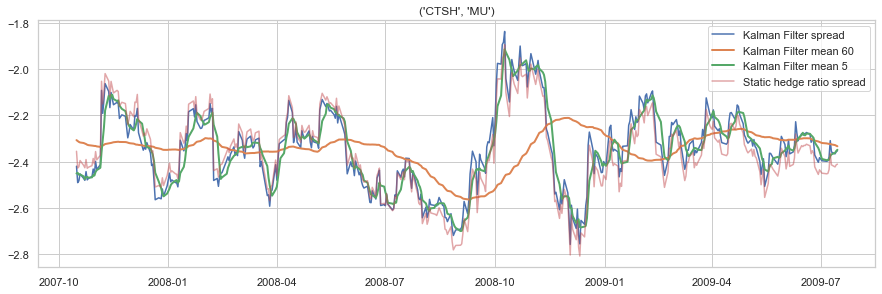

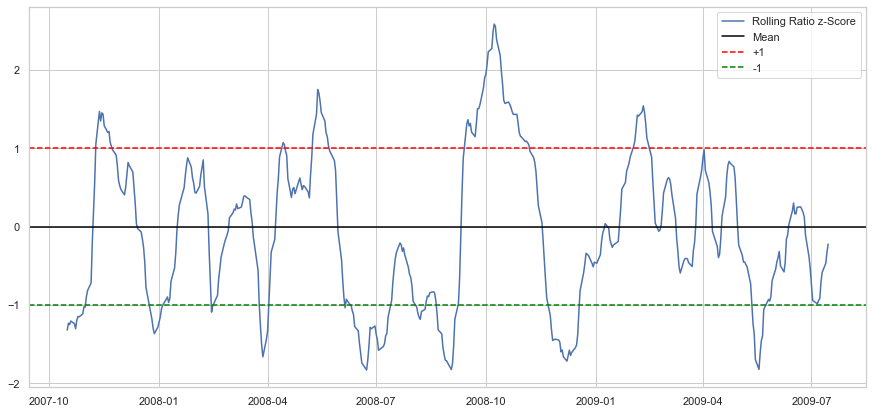

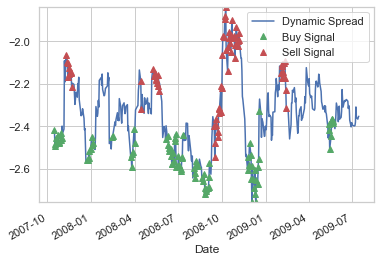

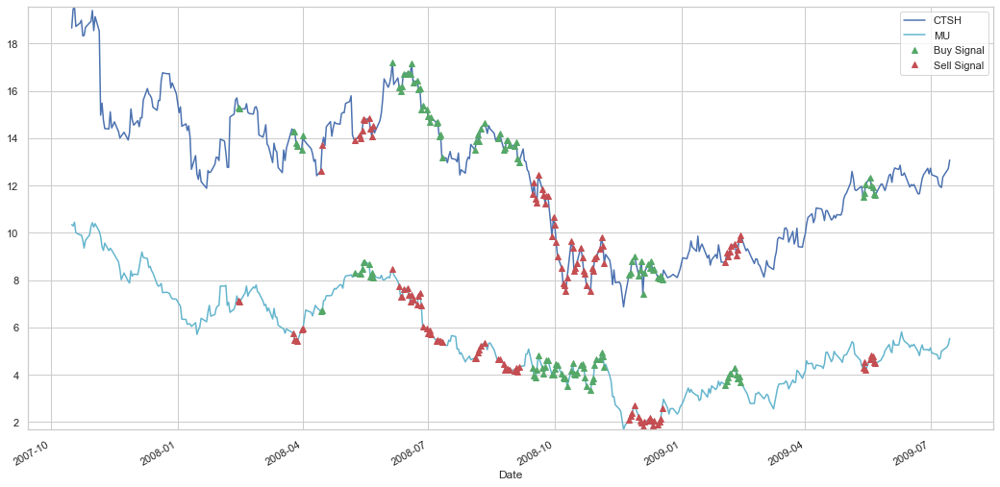

 53%|█████▎    | 10/19 [00:16<00:14,  1.57s/it]

('CTSH', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


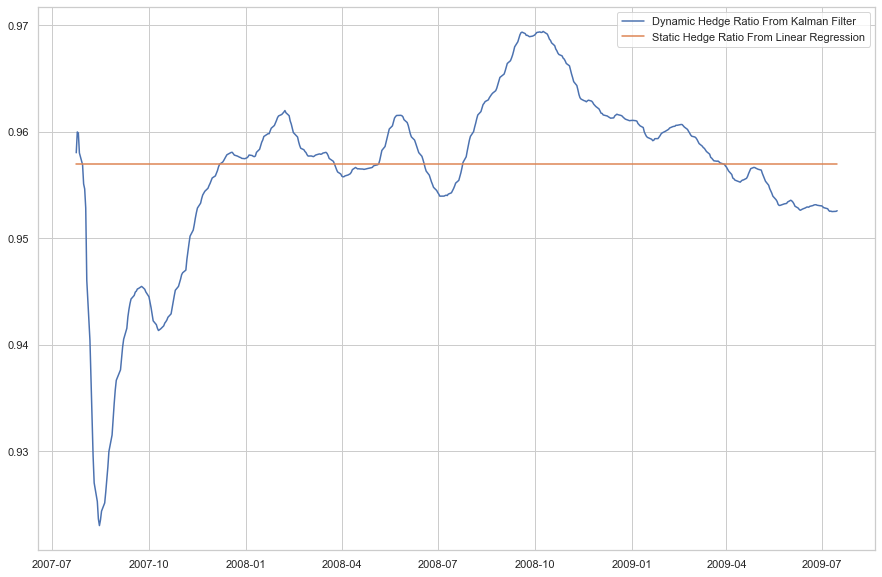

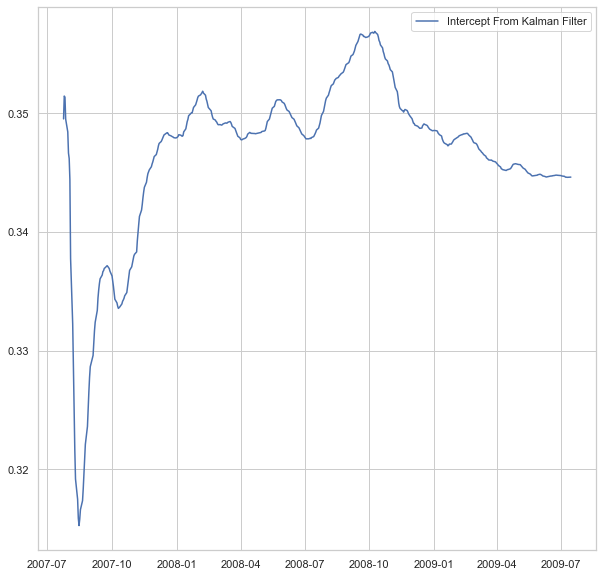

in backetester
(499, 9)
(440, 12)


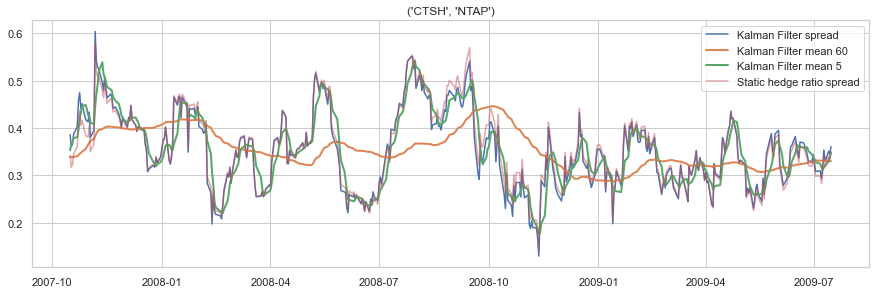

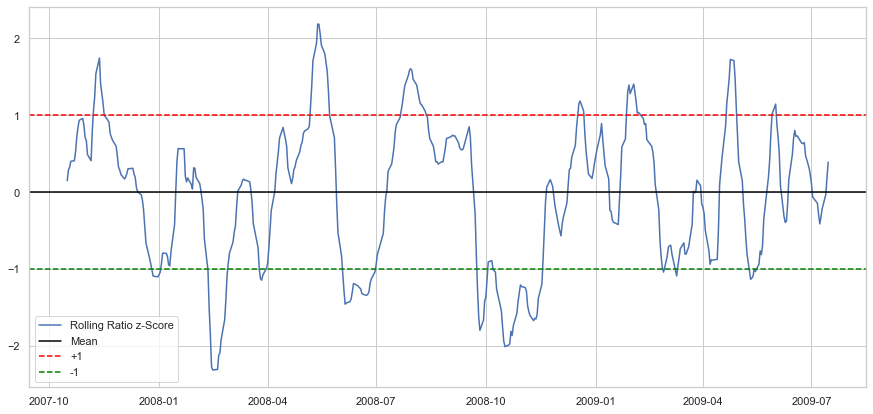

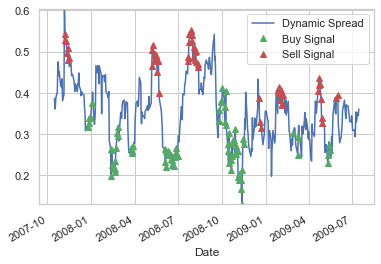

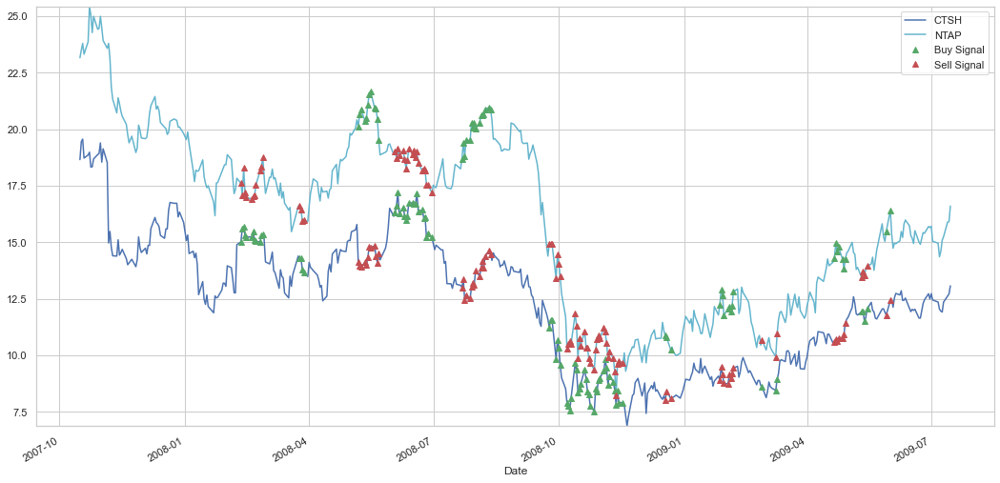

 58%|█████▊    | 11/19 [00:17<00:12,  1.58s/it]

('FIS', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


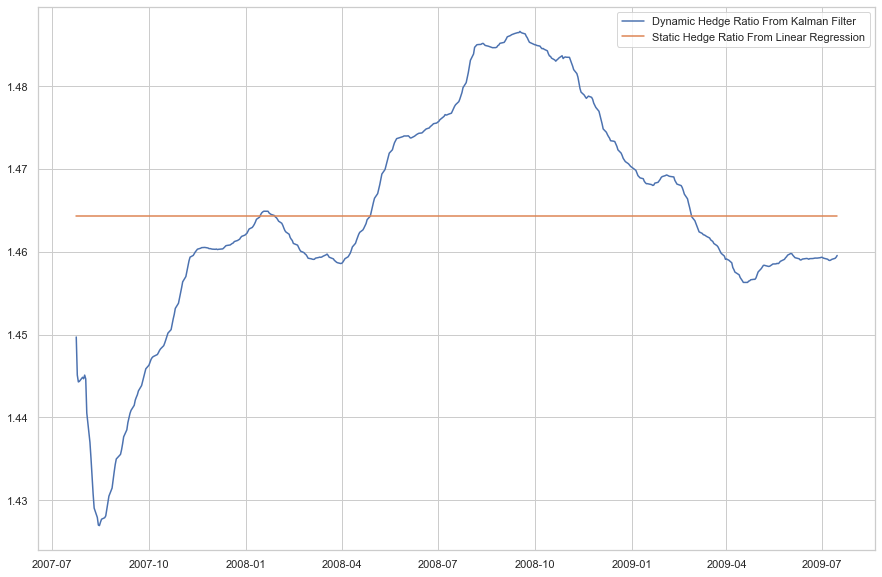

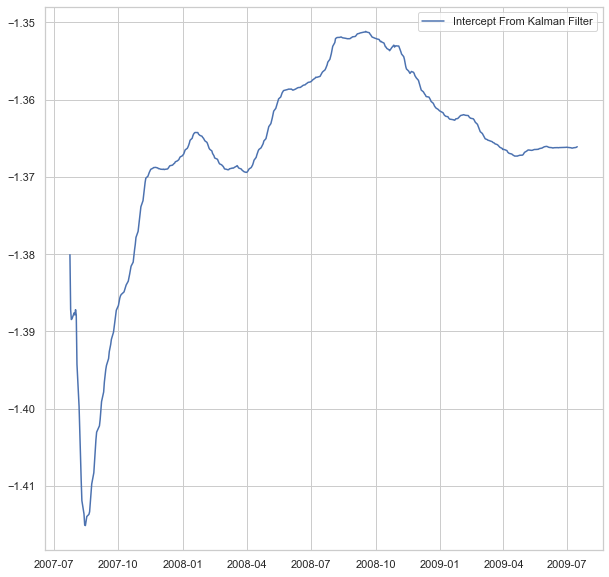

in backetester
(499, 9)
(440, 12)


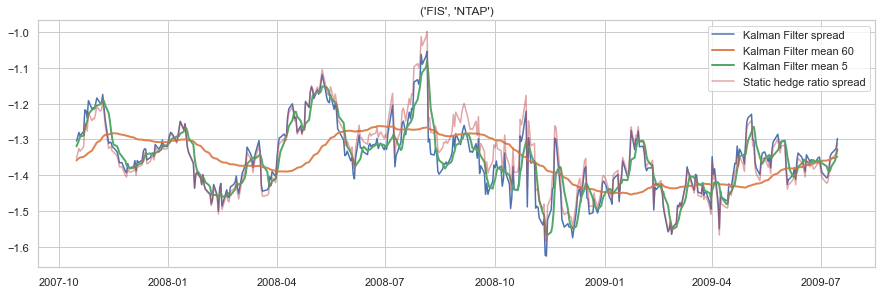

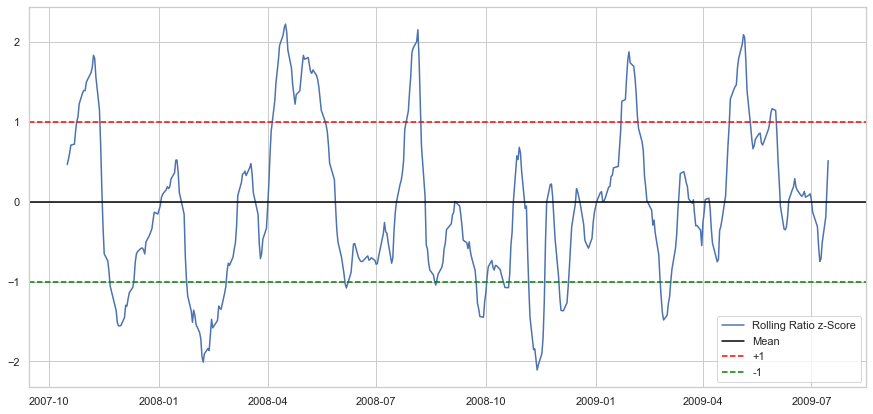

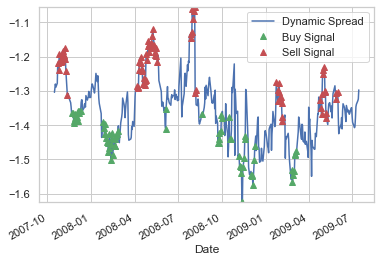

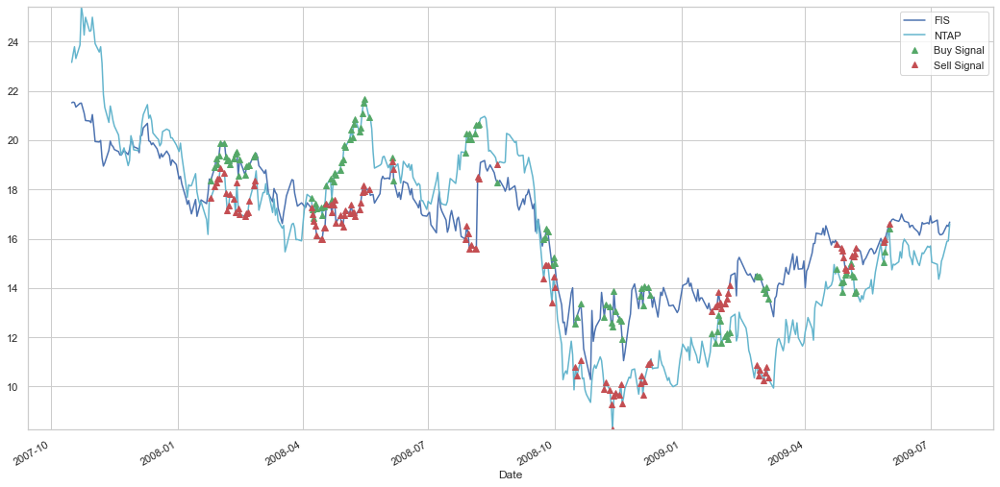

 63%|██████▎   | 12/19 [00:19<00:11,  1.59s/it]

('FISV', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


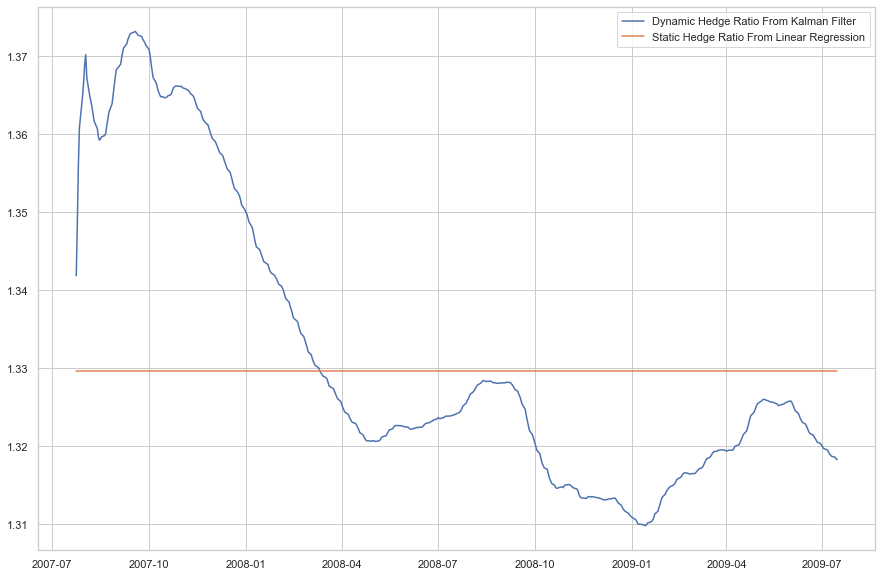

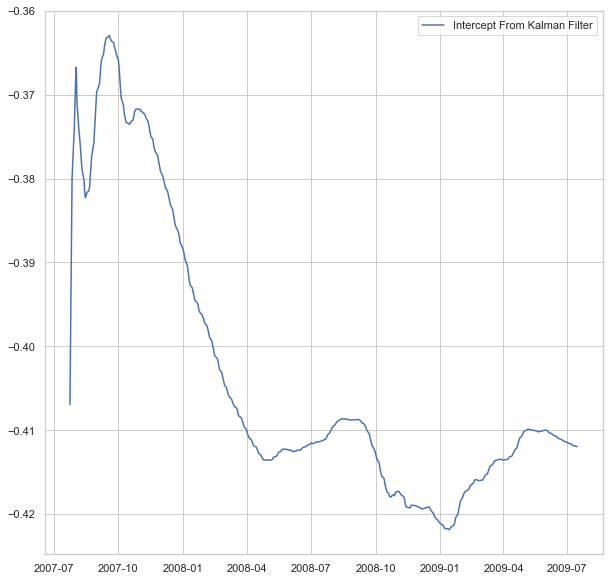

in backetester
(499, 9)
(440, 12)


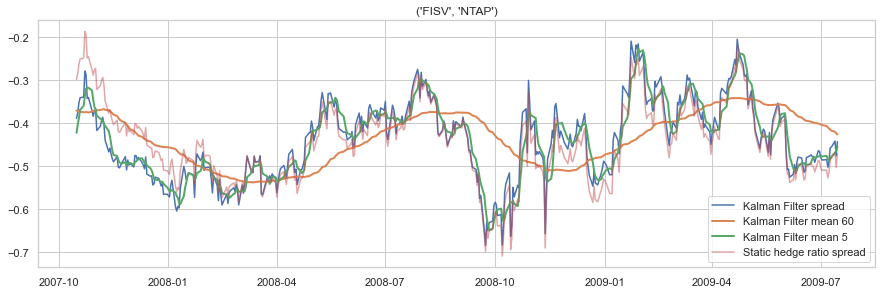

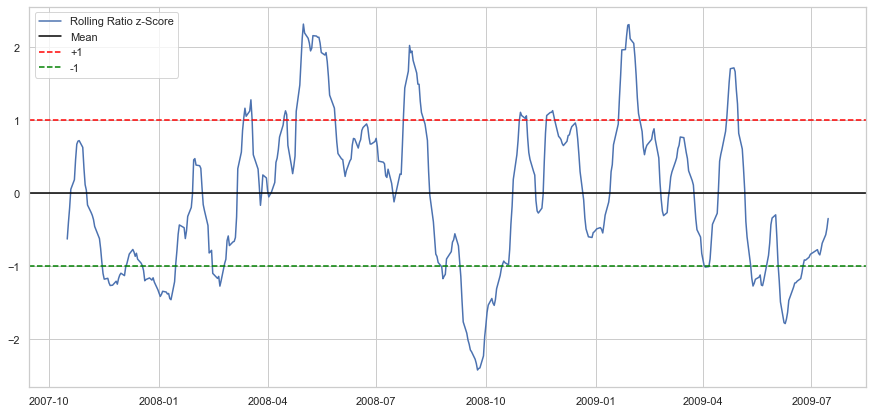

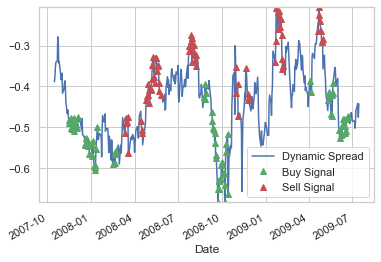

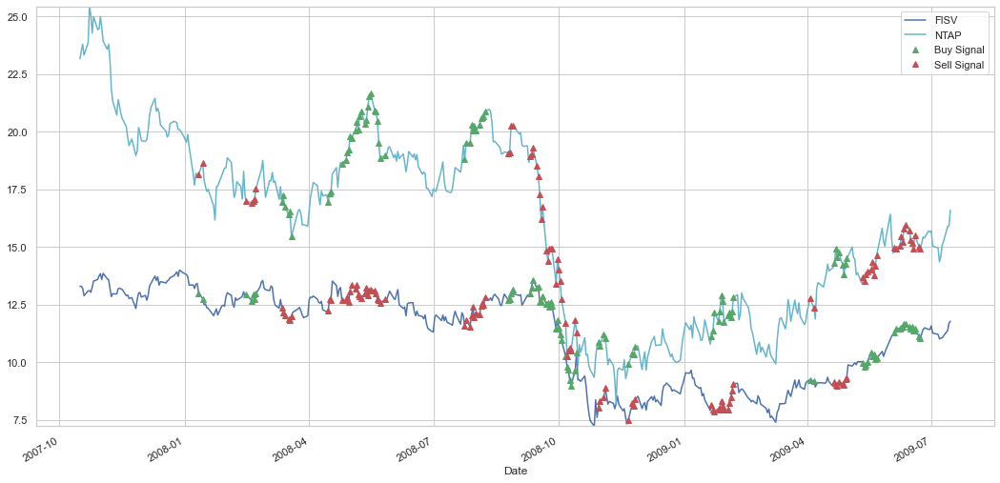

 68%|██████▊   | 13/19 [00:20<00:09,  1.58s/it]

('HPQ', 'INTC')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


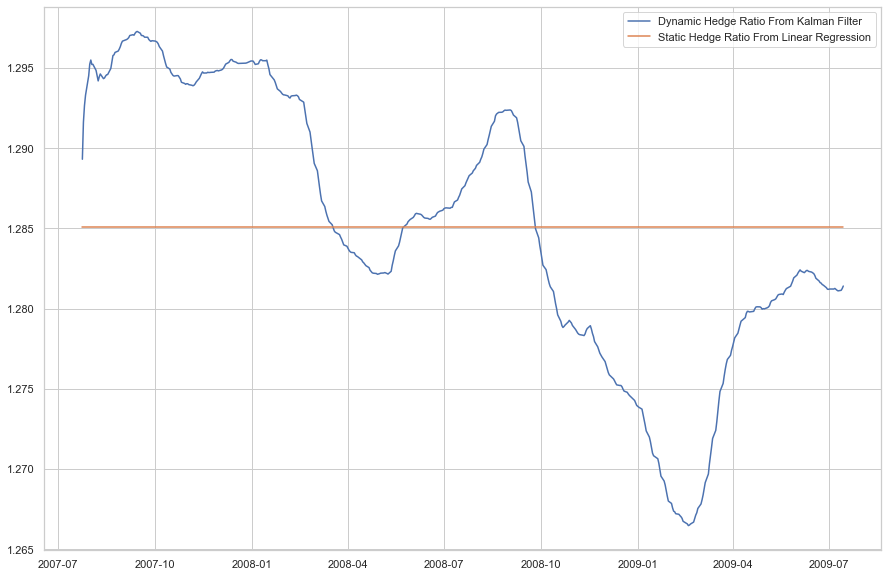

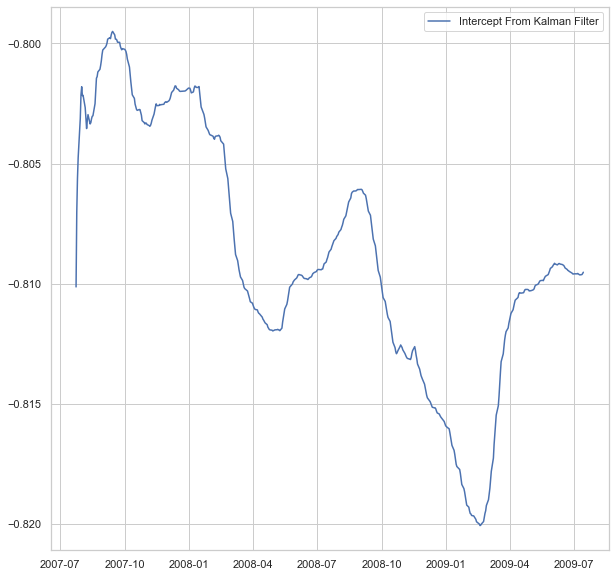

in backetester
(499, 9)
(440, 12)


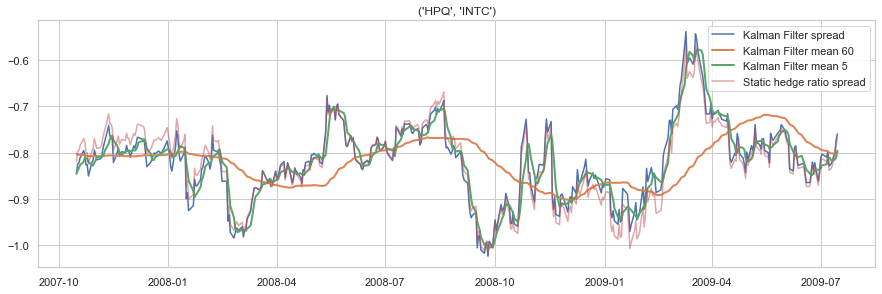

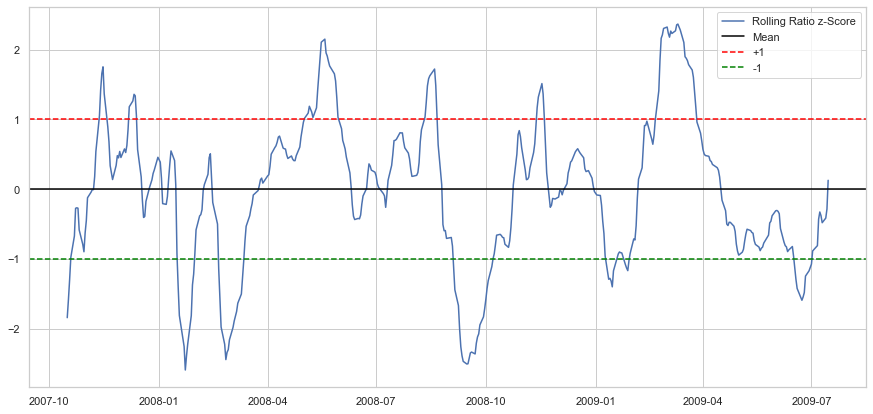

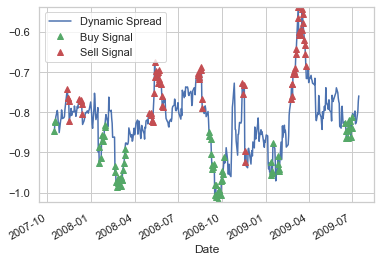

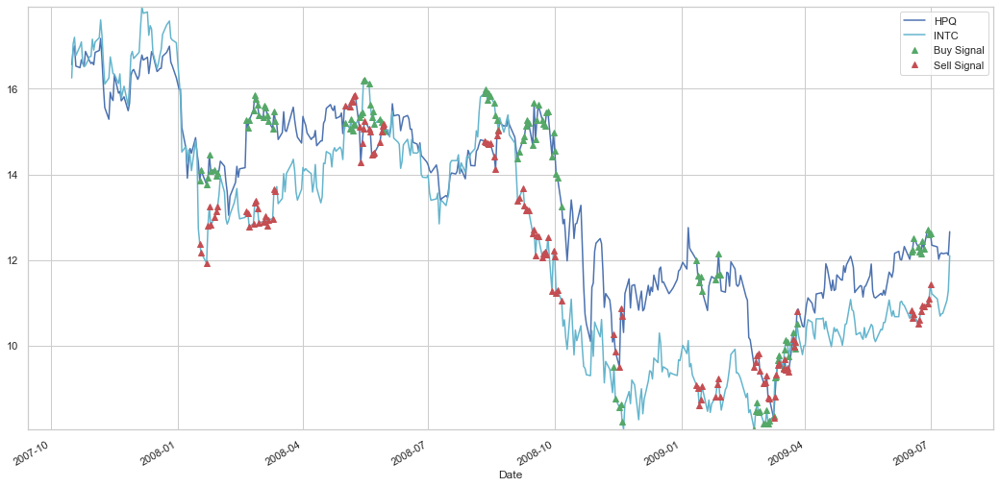

 74%|███████▎  | 14/19 [00:22<00:08,  1.65s/it]

('HPQ', 'MSFT')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


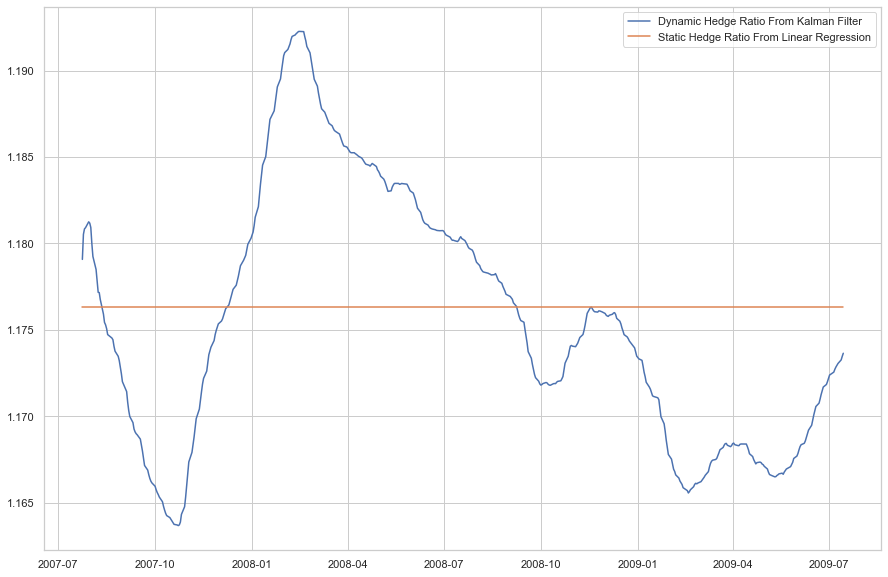

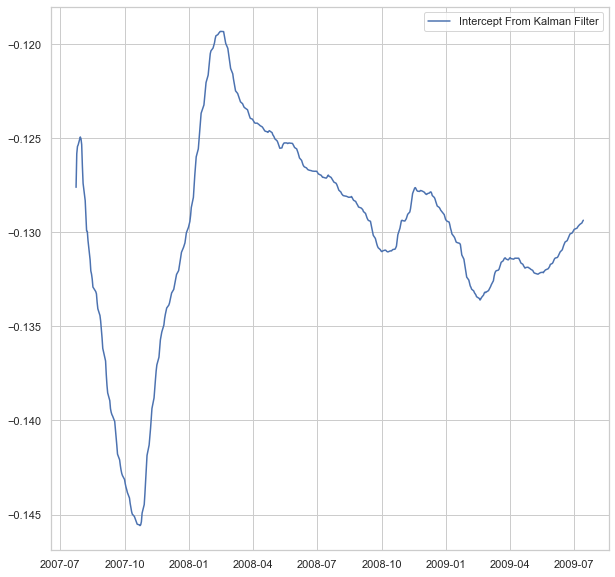

in backetester
(499, 9)
(440, 12)


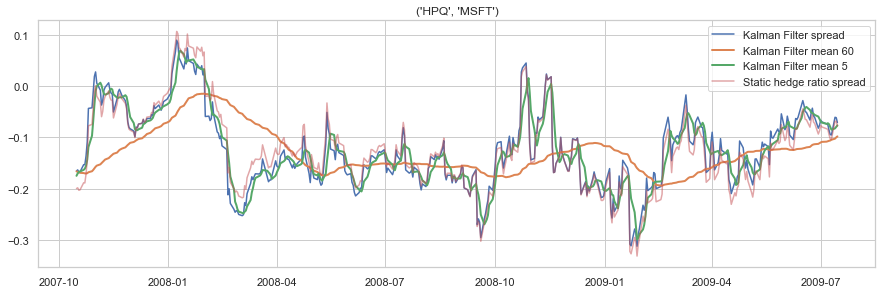

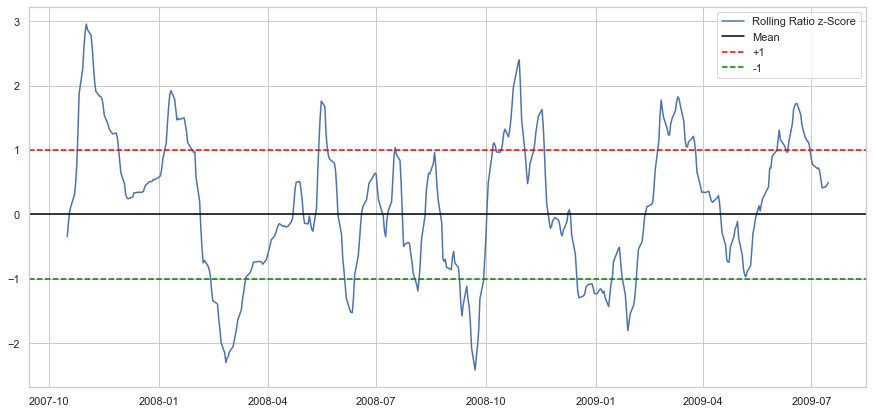

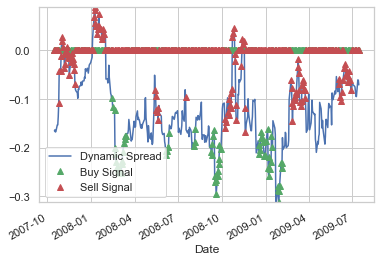

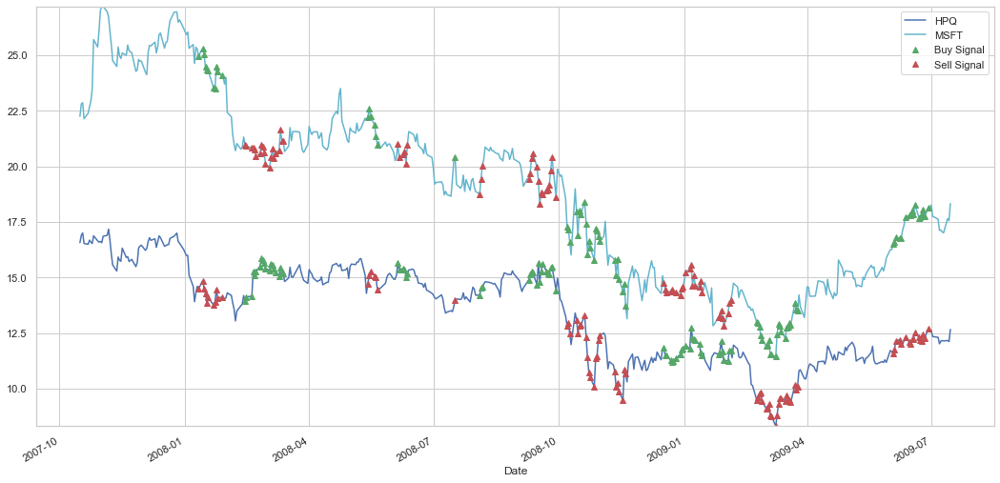

 79%|███████▉  | 15/19 [00:24<00:06,  1.64s/it]

('IBM', 'NLOK')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


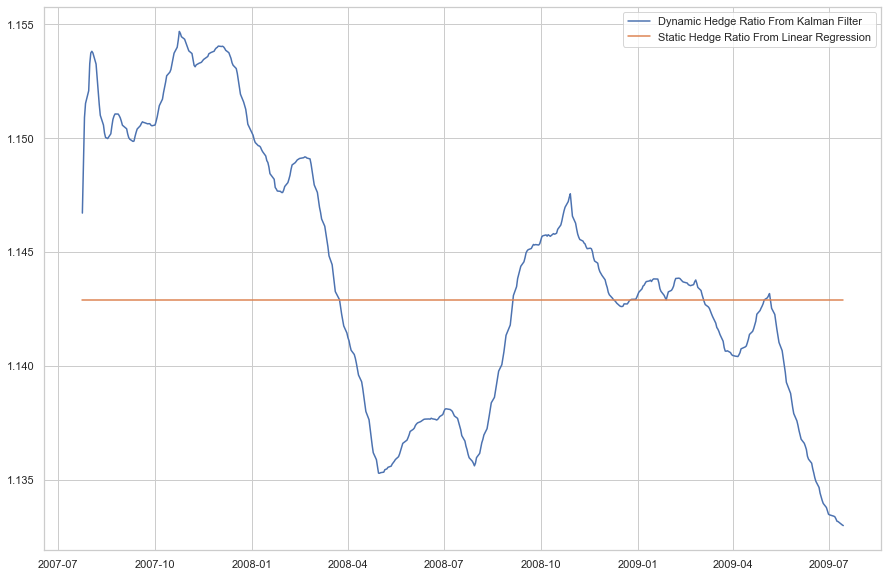

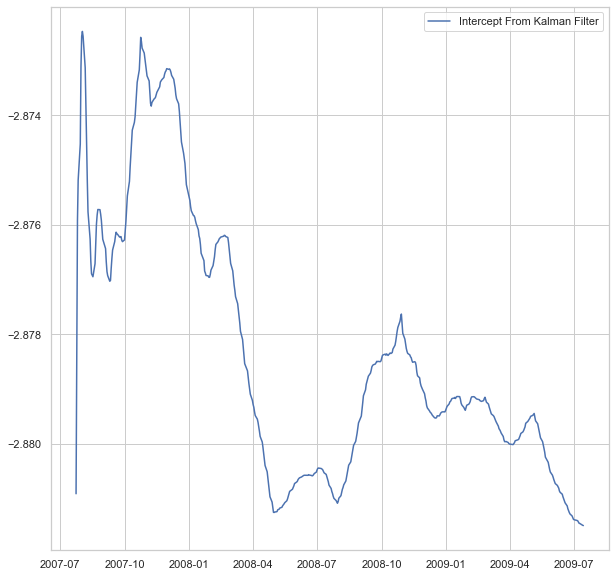

in backetester
(499, 9)
(440, 12)


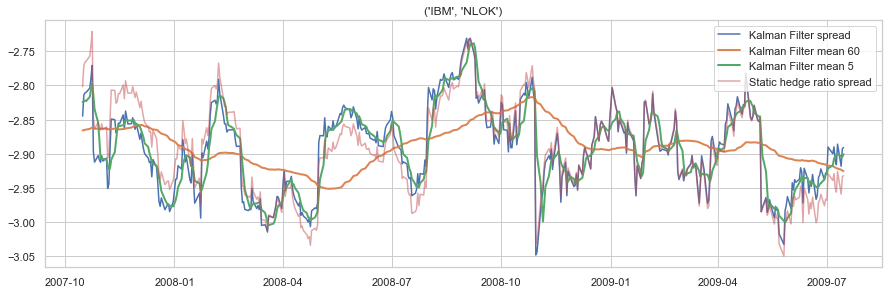

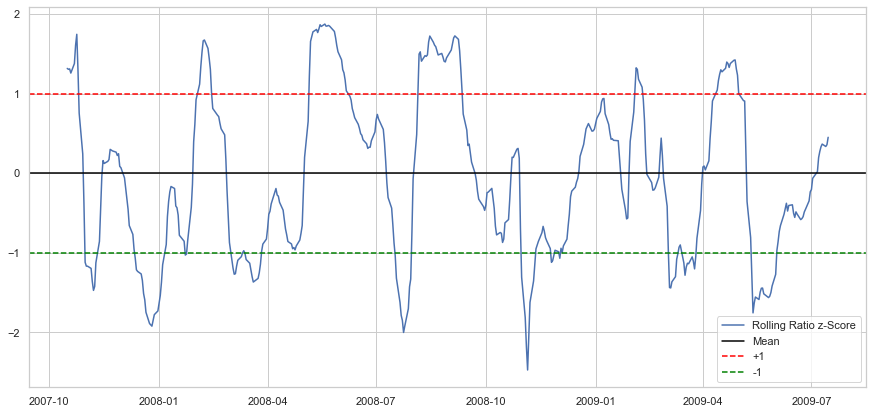

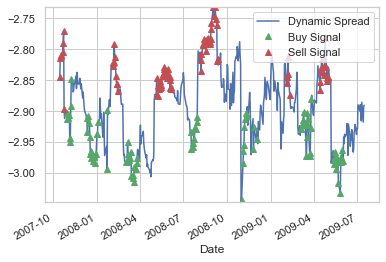

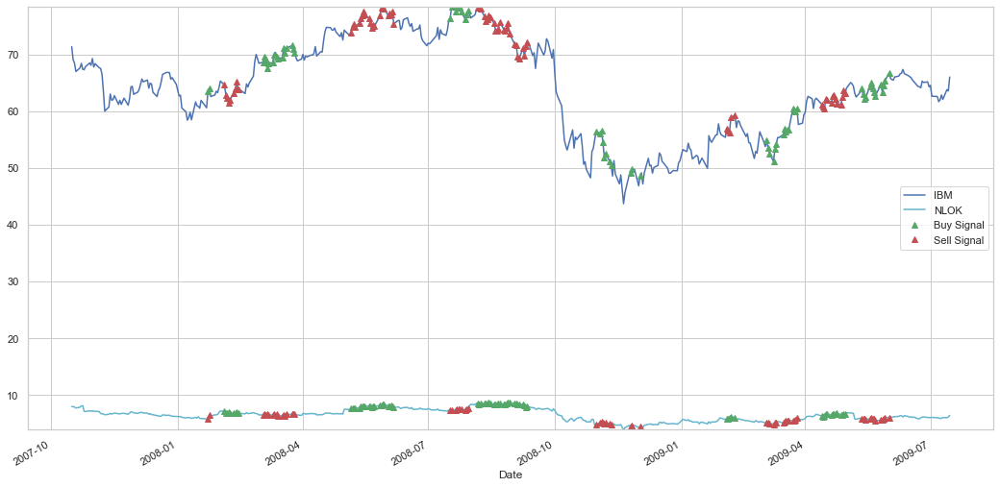

 84%|████████▍ | 16/19 [00:26<00:05,  1.67s/it]

('INTC', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


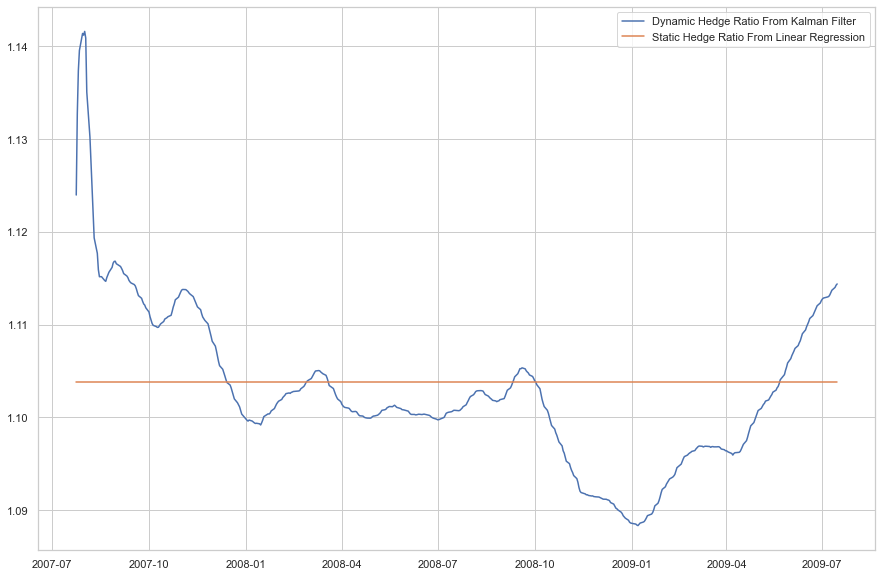

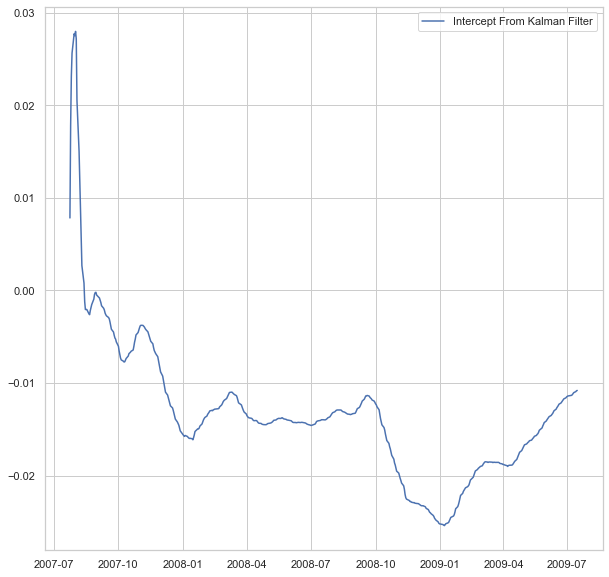

in backetester
(499, 9)
(440, 12)


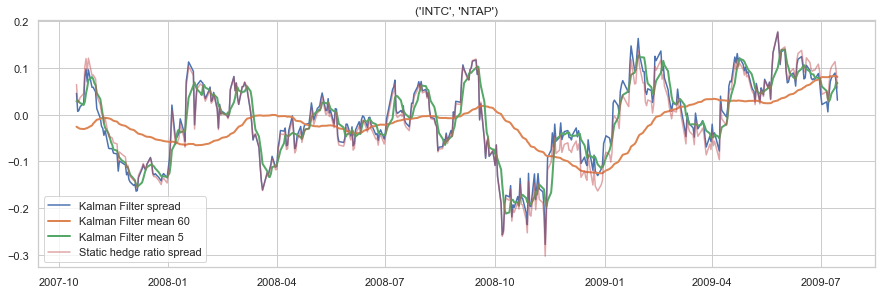

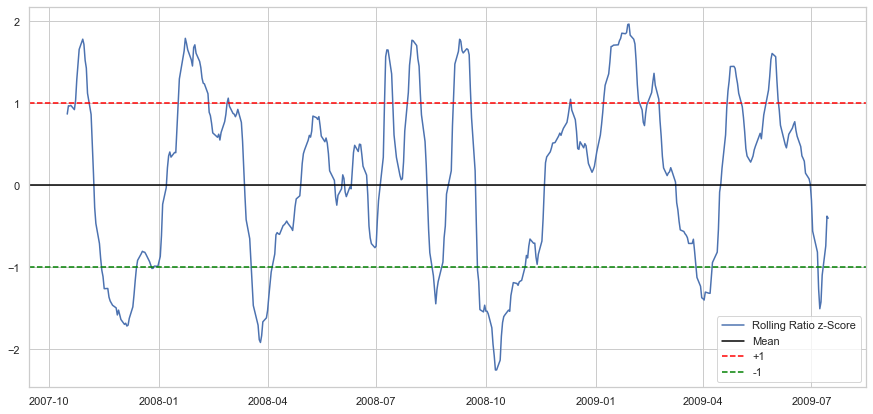

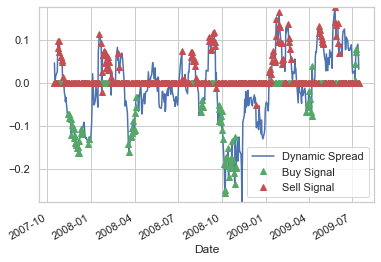

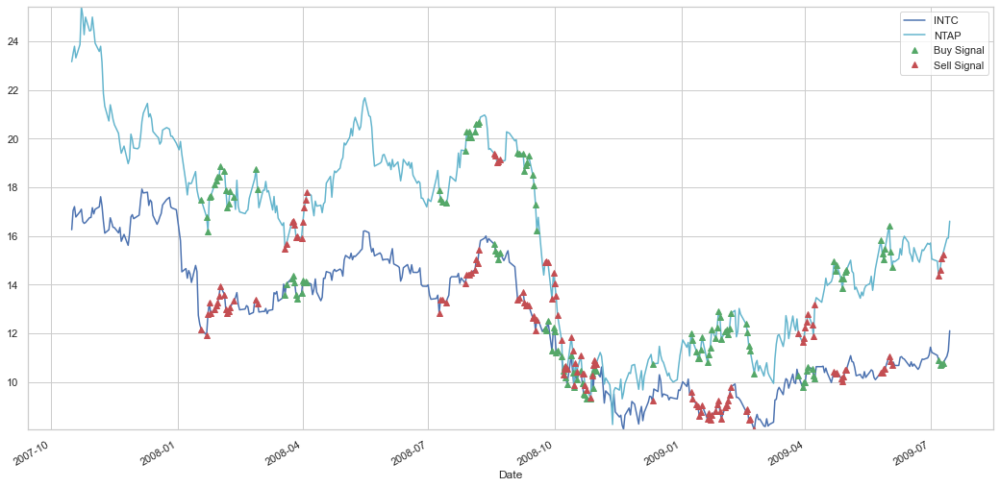

 89%|████████▉ | 17/19 [00:27<00:03,  1.66s/it]

('JNPR', 'NTAP')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


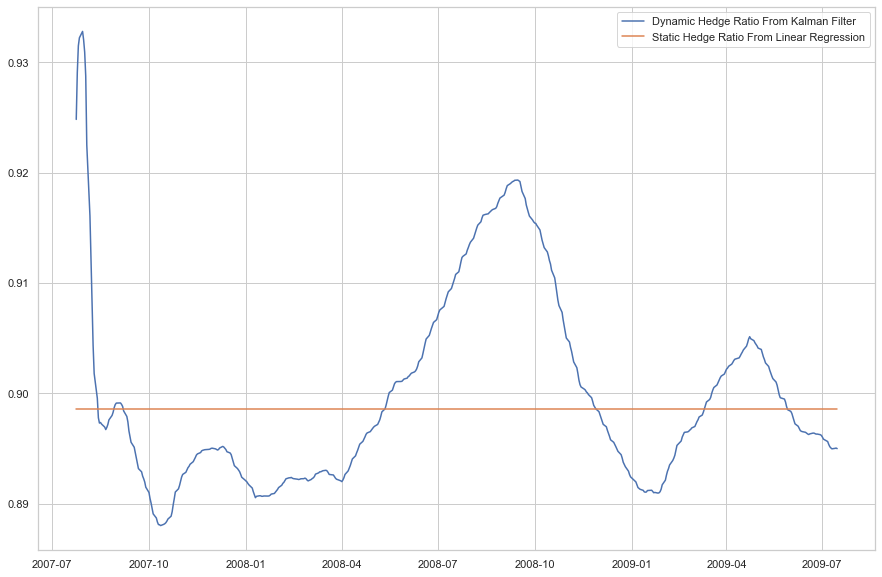

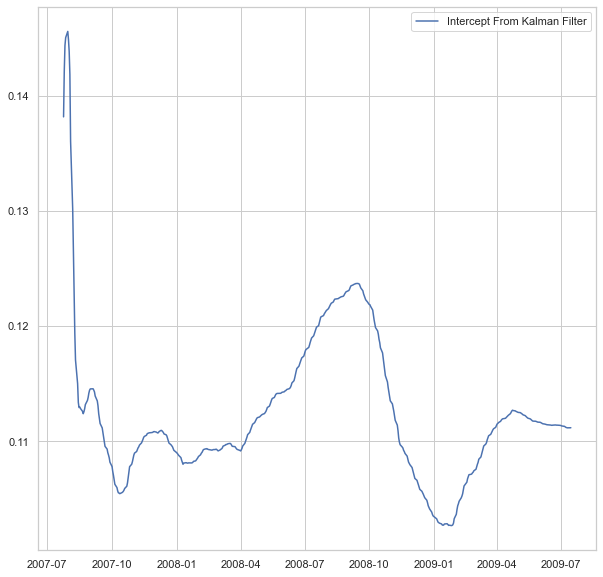

in backetester
(499, 9)
(440, 12)


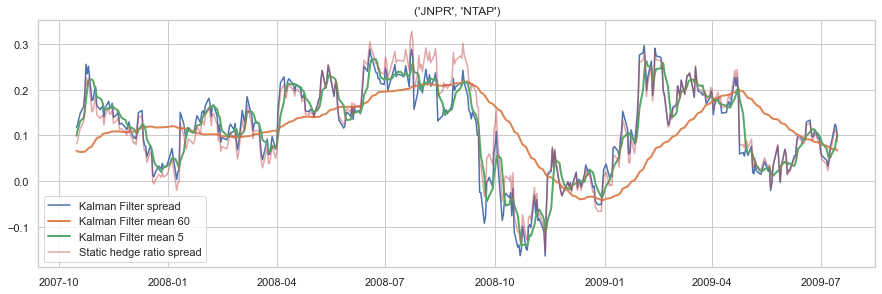

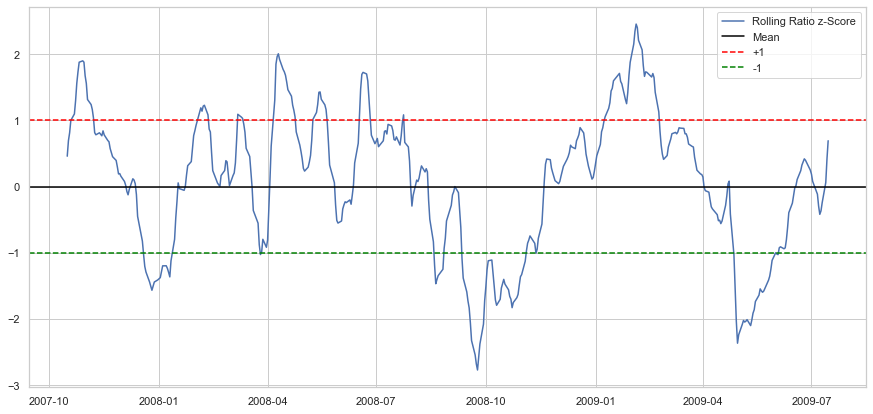

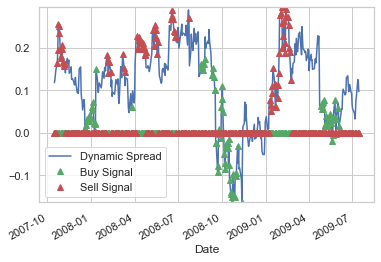

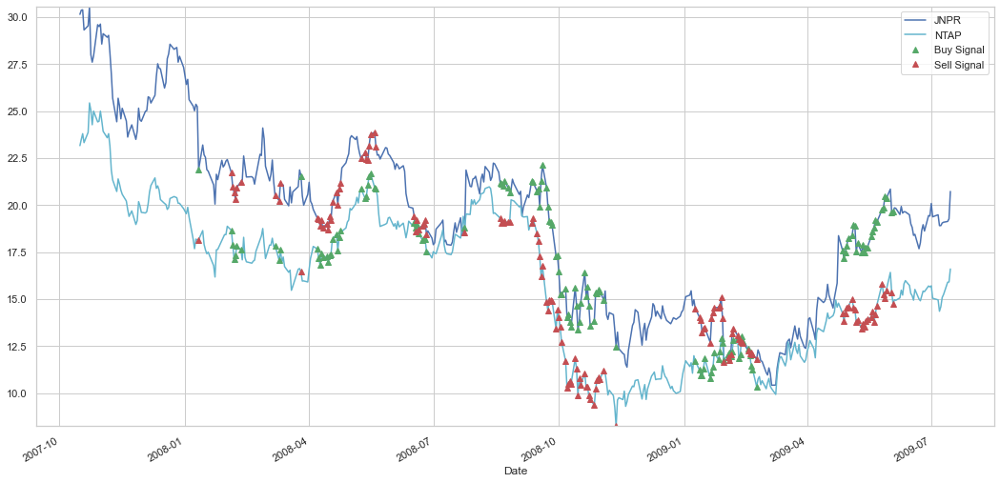

 95%|█████████▍| 18/19 [00:29<00:01,  1.62s/it]

('MU', 'NVDA')
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


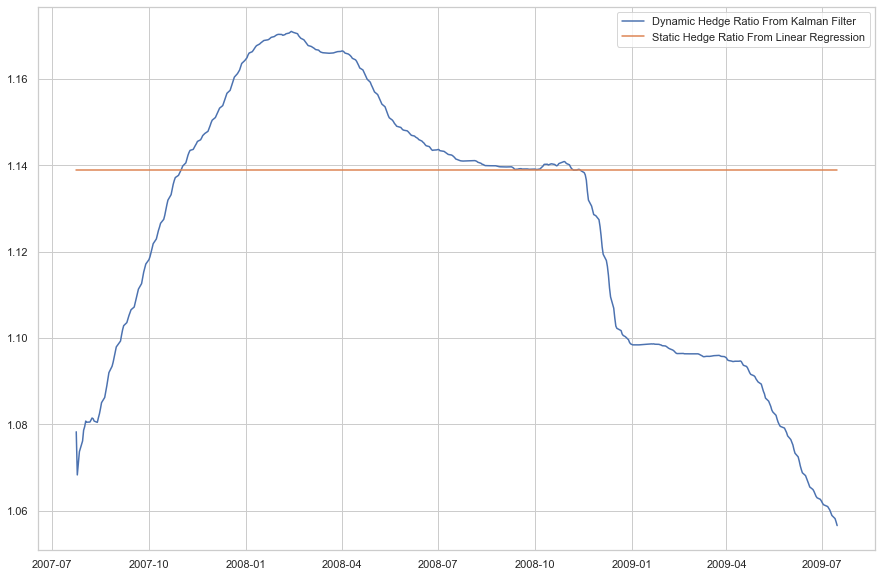

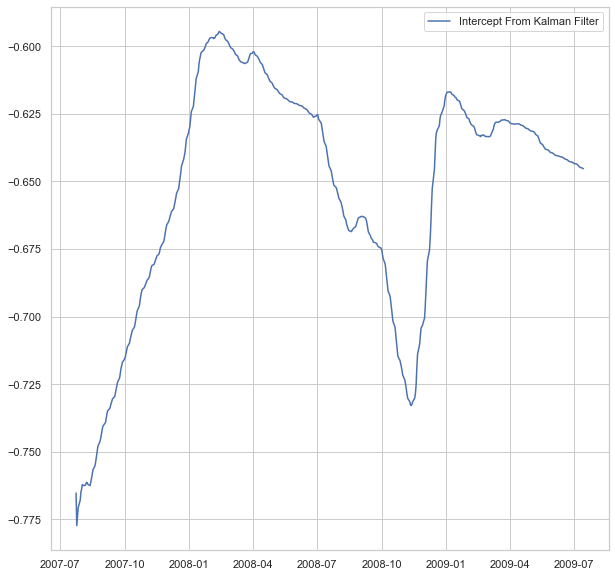

in backetester
(499, 9)
(440, 12)


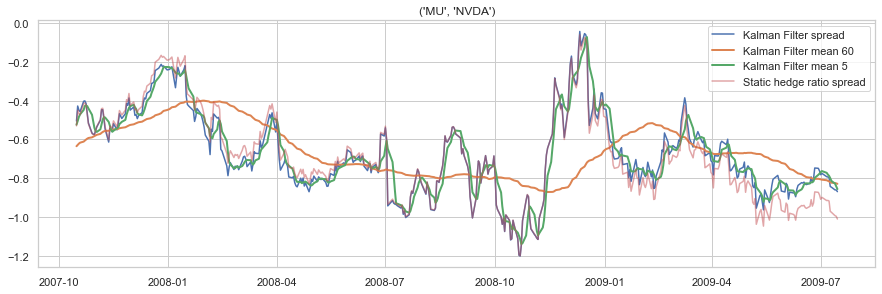

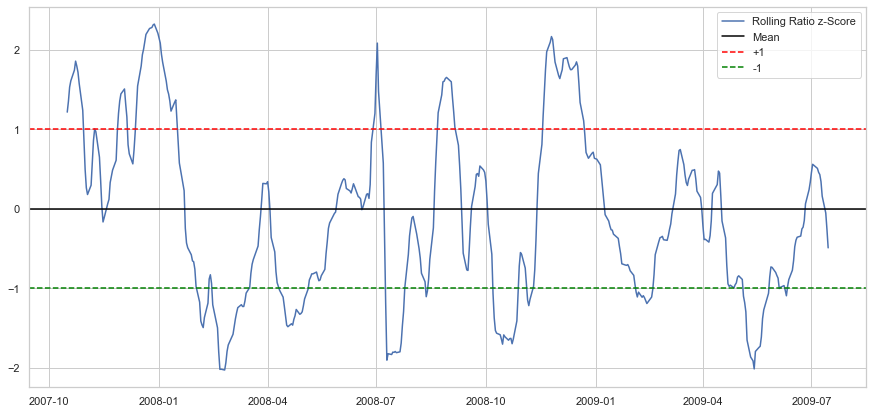

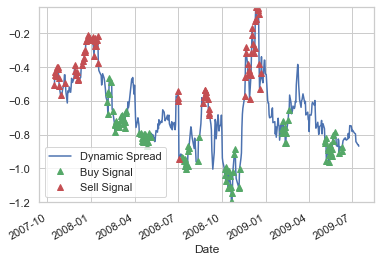

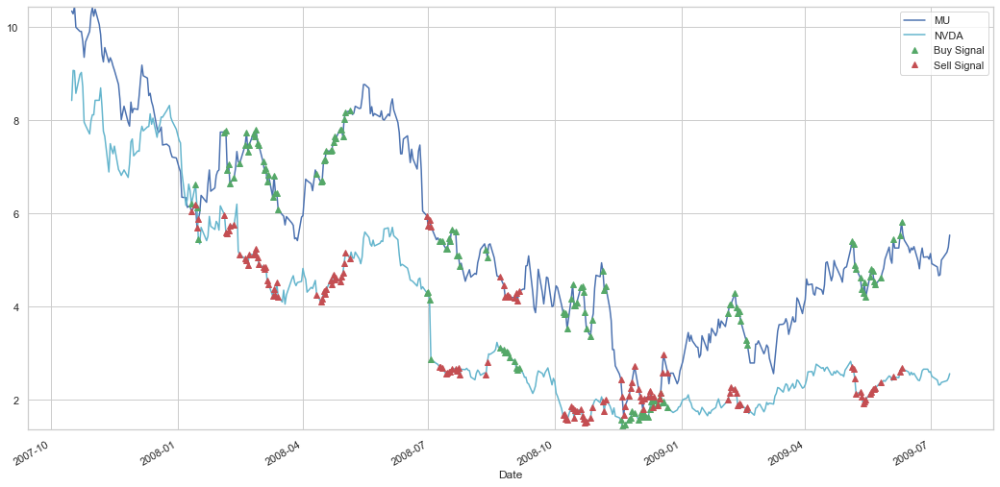

100%|██████████| 19/19 [00:30<00:00,  1.62s/it]


In [29]:
metrics={}
for i in tqdm(range(len(final_pairs))):
    tickers = final_pairs['Pairs'][i]
    print(tickers)
    metrics[tickers] = get_dynamic_and_static_HR(tickers , start_date , end_date , 'Log Price')

In [30]:
metrics

{('AAPL', 'ORCL'): {'PNL': -337.6256323484447,
  'hit ratio': 0.5631067961165048,
  'no_of_trades': 206,
  'return_portflio': -134.8312476835927,
  'max drawdown': -969.3182265976752},
 ('ADBE', 'HPQ'): {'PNL': 491.9614337472991,
  'hit ratio': 0.5167464114832536,
  'no_of_trades': 209,
  'return_portflio': 30.793609525247092,
  'max drawdown': -515.8368365691176},
 ('ADI', 'CTSH'): {'PNL': 77.76376930002925,
  'hit ratio': 0.4954128440366973,
  'no_of_trades': 218,
  'return_portflio': -83.2303870828427,
  'max drawdown': -715.2920501841763},
 ('ADI', 'NTAP'): {'PNL': -50.94716119270123,
  'hit ratio': 0.5181818181818182,
  'no_of_trades': 220,
  'return_portflio': -109.71409635572077,
  'max drawdown': -669.3819923771558},
 ('ADSK', 'HPQ'): {'PNL': -180.43898808367064,
  'hit ratio': 0.5550660792951542,
  'no_of_trades': 227,
  'return_portflio': -161.1313761398235,
  'max drawdown': -295.16591884167525},
 ('CSCO', 'FIS'): {'PNL': -158.0719639720581,
  'hit ratio': 0.5255813953488372

In [31]:
bear_metrics = pd.DataFrame.from_dict(metrics , orient='index').reset_index()
bear_metrics.columns = ['Pair1','Pair2','PNL','hit ratio','no_of_trades','return_portflio','max drawdown']

bear_metrics

,Pair1,Pair2,PNL,hit ratio,no_of_trades,return_portflio,max drawdown
0,AAPL,ORCL,-337.625632,0.563107,206,-134.831248,-969.318227
1,ADBE,HPQ,491.961434,0.516746,209,30.793610,-515.836837
2,ADI,CTSH,77.763769,0.495413,218,-83.230387,-715.292050
3,ADI,NTAP,-50.947161,0.518182,220,-109.714096,-669.381992
4,ADSK,HPQ,-180.438988,0.555066,227,-161.131376,-295.165919
5,CSCO,FIS,-158.071964,0.525581,215,-13841.147064,-40.870384
6,CSCO,HPQ,22.818064,0.518349,218,-70.401069,-119.912093
7,CTSH,FIS,-138.903121,0.550000,180,-1240.072039,-198.631946
8,CTSH,JNPR,-108.967784,0.513636,220,-3675.358546,-57.157357
9,CTSH,MU,-40.505246,0.490291,206,-192.687700,-582.382131
